In [1]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import shapely
import plotly.express as px
from datetime import datetime

pd.options.mode.chained_assignment = None  # default='warn'

# Cost per co2 reduction

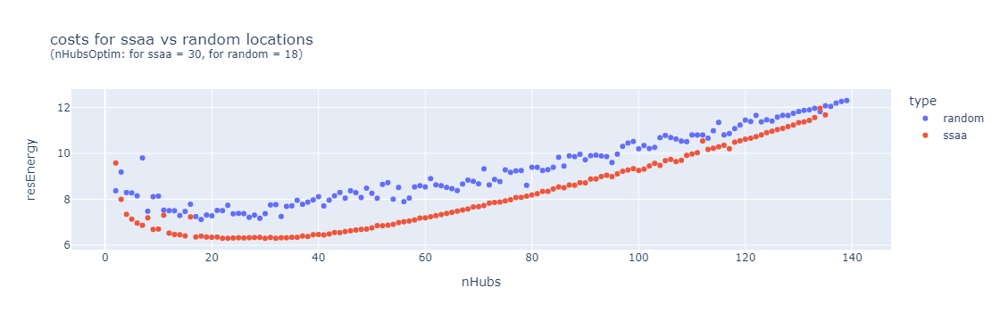

In [2]:
# df random
resEnergy_random = pd.read_csv('results/resEnergy_random_all')
resEnergy_random = resEnergy_random[['nHubs', 'resEnergy', 'type']]

# # df ssaa
cols = ['index', 'resEnergy', 'nHubs', 'startTime', 'endTime']
resEnergy_ssaa_file = pd.read_csv('results/resEnergy_230331.csv', header=None, names=cols)
resEnergy_ssaa = resEnergy_ssaa_file.copy()
resEnergy_ssaa = resEnergy_ssaa.groupby('nHubs').min().resEnergy.reset_index()
resEnergy_ssaa['type'] = 'ssaa'

# optimal nHubs
nHubsOptim_ssaa = resEnergy_ssaa.sort_values('resEnergy').iloc[0,0]
nHubsOptim_random = resEnergy_random.sort_values('resEnergy').iloc[0,0]

# combine and plot
resEnergy_combined = pd.concat([resEnergy_random, resEnergy_ssaa])
fig = px.scatter(resEnergy_combined, 'nHubs', 'resEnergy', color='type', 
                 title='costs for ssaa vs random locations <br><sup>(nHubsOptim: for ssaa = {}, for random = {})</sup>'.format(nHubsOptim_ssaa, nHubsOptim_random))
fig.show()

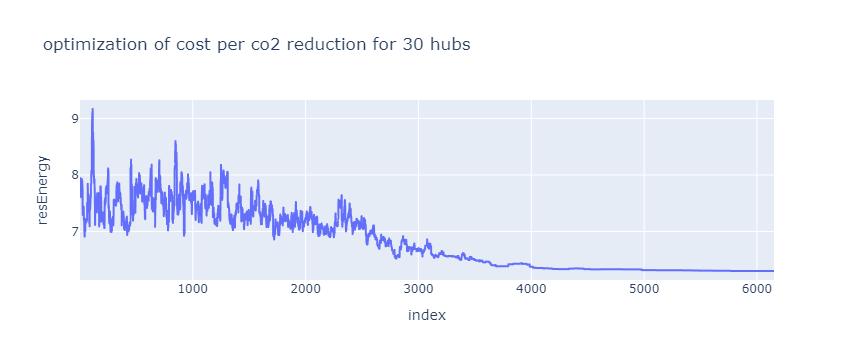

In [3]:
nHubs = 30
temp = resEnergy_ssaa_file[resEnergy_ssaa_file.nHubs == nHubs]
px.line(temp, x='index', y='resEnergy', title='optimization of cost per co2 reduction for {} hubs'.format(nHubs))

# Component break down

In [9]:
# read data, coefficients
cols = ['index', 'hubName', 'x', 'y', 'nHubs', 'startTime', 'endTime']
resPointsFile = pd.read_csv('results/resPoints_230331.csv', header=None, names=cols)
resPoints = resPointsFile.copy()
resPoints = resPoints[['hubName', 'x', 'y', 'nHubs']]
resPoints.hubName = resPoints.hubName - 1
resPoints = gpd.GeoDataFrame(resPoints, geometry = gpd.points_from_xy(resPoints.x, resPoints.y), crs='EPSG:28992')

matGrid = gpd.read_file('data/matGrid_ams.shp')
candiHubs = gpd.read_file('data/candiHubs_ams.shp')
distMatrix = np.load('data/costMatrix_ams.npy')
streets = gpd.read_file('data/ams_edges.shp')

## calculating components using the cost effectiveness function

In [10]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
from numpy import exp
from numpy.random import rand, seed
import shapely
from shapely.geometry import Polygon, Point, MultiPoint
from sklearn.cluster import KMeans 
import math
import plotly.express as px
import random
pd.options.mode.chained_assignment = None  # default='warn'

# Transportation cost coefficient: 
costPerKmPerTon = 0.06

# Transporation emissions coefficient: 
truckCapacityTons = 27 # same truck capacity as calculating transportation cost 'groot stukgoed' 
emissionsPerTruckPerKm_kg = 0.6653 # according to ecoInvent pdf p63 
emissionsPerTruckPerKm_tons = emissionsPerTruckPerKm_kg / 1000
emissionsPerTonPerKm_tons = emissionsPerTruckPerKm_tons / truckCapacityTons

# packaging coefficients into dictionary 
coefs = {
    'tco2ReductionPerTon': 1.52, 
    'storageMonths': 6,
    'buildingPrice': 250, 
    'costPerKmPerTon': costPerKmPerTon, # trans cost (euros) - per km per ton
    'emissionsPerTonPerKm': emissionsPerTonPerKm_tons # trans emissions (tCO2) - per km per ton
}

tco2ReductionPerTon = coefs['tco2ReductionPerTon']
storageMonths = coefs['storageMonths']
buildingPrice = coefs['buildingPrice']
costPerKmPerTon = coefs['costPerKmPerTon']
emissionsPerTonPerKm = coefs['emissionsPerTonPerKm']


def findFirstGuess(nHubs, candiHubs, matGrid): 
    '''
    selects hubs evenly spread throughout the study area. 
    inputs: 
        * nHubs 
        * candiHubs
        * matGrid 
    returns: 
        * hubs - gdf of selected hub locations with columns 'hubName' and 'geometry'
    '''
    # prep kMeans input 
    matGrid['x'] = matGrid.geometry.x
    matGrid['y'] = matGrid.geometry.y
    X = np.array(matGrid[['x', 'y']])

    # run kmeans 
    kmeans = KMeans(n_clusters=nHubs, random_state=0).fit(X)
    matGrid['cluster'] = kmeans.labels_

    # find centroid for each cluster and closest candiHubs point 
    clusterNums = list(matGrid.cluster.unique())
    candiIndexes = []
    for clusterNum in clusterNums: 

        # find centroid 
        clusterGdf = matGrid[matGrid.cluster == clusterNum]
        clusterCentroid = clusterGdf.dissolve().centroid

        # find closest candiHubs point
        candiIndex = candiHubs.geometry.sindex.nearest(clusterCentroid)[1,0]
        candiIndexes.append(candiIndex)

    # make hubs - gdf of chosen hubs 
    hubs = candiHubs.iloc[candiIndexes]
    
    # formatting
    hubs = hubs[['hubName', 'pPerSqm', 'geometry']]
    hubs = hubs.drop_duplicates() 
    # hubs = list(hubs.hubName)
    
    return hubs 

def assignHubsToGridCells(hubs, matGrid, distMatrix): 
    def findHub(matGrid_index): 
        hubs_index = [int(x) for x in list(hubs.hubName)]
        dists = distMatrix[matGrid_index, hubs_index]
        idxmin = np.argmin(dists)
        chosenHub = hubs_index[idxmin]
        return chosenHub
    matGrid['hubName'] = matGrid.index.map(lambda x: findHub(x))
    
    # formatting 
    matGrid = matGrid[['kgDemand', 'kgSupply', 'hubName', 'geometry']]
    
    return matGrid 

def calcTotCo2Reduction(hubs, matGridAss, tco2ReductionPerTon): 
    
    # calculate co2Avoided for each hub
    def calcCo2Avoided(row): 
        hubName = row.hubName

        # select hub's clients - both supply and demand
        clients = matGridAss[matGridAss.hubName == hubName]
        supply = clients[clients.kgSupply > 0][['kgSupply', 'geometry']]
        demand = clients[clients.kgDemand > 0][['kgDemand', 'geometry']]

        # calculate amount of supply and demand 
        supplyTons = supply.kgSupply.sum() / 1000
        demandTons = demand.kgDemand.sum() / 1000 

        # calculate EOL emissions for primary and secondary scenario 
        co2Primary = tco2ReductionPerTon * supplyTons # all waste (supply) is incinerated, and not reused 
        wastedTons = supplyTons - demandTons if supplyTons - demandTons > 0 else 0 # supply is wasted if there is a surplus
        co2Secondary = tco2ReductionPerTon * wastedTons
        co2Avoided = co2Primary - co2Secondary

        return co2Avoided
    hubs['co2Avoided_tons'] = hubs.apply(lambda row: calcCo2Avoided(row), axis=1)

    # calculate CO2 avoided for all hubs
    totCo2Avoided = hubs.co2Avoided_tons.sum()

    return totCo2Avoided


def calcTotStorageCost(hubs, matGridAss, candiHubs, returnHubs=False): 

    def calcm2storage(row): 
        hubName = row.hubName 
        # print('\nhubName: {}'.format(hubName))

        # calculate material stored in hub in kg
        clients = matGridAss[matGridAss.hubName == hubName]
        kgSupply = clients.kgSupply.sum()
        kgDemand = clients.kgDemand.sum()
        kgStored = kgSupply if kgDemand > kgSupply else kgDemand 

        # calculate kgStored assuming throughput 
        storageMonths = 1 # previously 6 months
        studyPeriodMonths = 5 * 12 # 5 years 
        percStorageMonths = storageMonths / studyPeriodMonths * 100 
        kgStored = kgStored * percStorageMonths / 100

        # calculate storage area required
        avTimberDensity = 510 # see CO2 opslag rekening tool
        avStorageHeight = 3.5 # meters 
        kgStoredPerM2 = avTimberDensity * 0.8 * avStorageHeight
        m2storage = kgStored / kgStoredPerM2

        # calculate storate area required + logistics space 
        percAreaLogistics = 30
        percAreaStorage = 100 - percAreaLogistics
        m2storage = m2storage / percAreaStorage * 100
        mStorageWidth = math.sqrt(m2storage)
        
        # min storage area 
        minStorageArea = 50
        if m2storage < minStorageArea: 
            m2storage = minStorageArea
        
        return m2storage
    
    def calcStoragePrice(row): 
        # calculate land and building price
        landPrice = row.pPerSqm
        buildingPrice = 250 # euros per sqm 
        totalPrice = landPrice + buildingPrice # euros per sqm 
        
        return totalPrice
    
    # sum storage cost for all hubs
    hubs['m2'] = hubs.apply(lambda row: calcm2storage(row), axis=1)
    hubs['storagePrice'] = hubs.apply(lambda row: calcStoragePrice(row), axis=1)
    hubs['storageCost'] = hubs.m2 * hubs.storagePrice
    totStorageCost = hubs.storageCost.sum()
    
    if returnHubs: 
        return hubs, totStorageCost 
    else:
        return totStorageCost


def calcTotTransportationCost(hubs, matGridAss, distMatrix, costPerKmPerTon):
    # define transportation price coefficient 
    # see data/transportation/tansCostPerKm_grootStukgoed.csv 
    # costPerKmPerTon = 0.06
    
    # calculate total transportation cost for all hubs 
    transCosts_allHubs = []
    for hubName in hubs.hubName: 
        hub = hubs[hubs.hubName == hubName]

        # find locations of demand and supply
        clients = matGridAss[matGridAss.hubName == hubName]
        demand = clients[clients.kgDemand > 0][['kgDemand', 'geometry']]
        supply = clients[clients.kgSupply > 0][['kgSupply', 'geometry']]

        # calculate total transportation cost for all client locations
        def calcTransCost(row): 
            distanceM = distMatrix[row.name, hubName]
            distanceKm = distanceM / 1000
            weightKg = row.iloc[0]
            weightTons = round(weightKg / 1000, 2)
            transCost = distanceKm * weightTons * costPerKmPerTon
            return transCost 
        demand['transCost'] = demand.apply(lambda row: calcTransCost(row), axis=1)
        supply['transCost'] = supply.apply(lambda row: calcTransCost(row), axis=1)

        totTransCost = demand.transCost.sum() + supply.transCost.sum()
        transCosts_allHubs.append(totTransCost)

    # print total transportation costs for all hubs 
    transCosts_allHubs = np.array(transCosts_allHubs).sum()

    return transCosts_allHubs 
    
    # sum transportation emissions all hubs
    hubs['transCost'] = hubs.hubName.map(lambda x: calcTransportationCost(x, transPriceCoef))
    totTransCost = hubs.transCost.sum()
    return totTransCost


def calcTotTransportationEmissions(hubs, matGridAss, distMatrix, emissionsPerTonPerKm): 
    
    # # define CO2 emissions per ton of material per km of transportation 
    # truckCapacityTons = 27 # same truck capacity as calculating transportation cost 'groot stukgoed' 
    # emissionsPerTruckPerKm_kg = 0.6653 # according to ecoInvent pdf p63 
    # emissionsPerTruckPerKm_tons = emissionsPerTruckPerKm_kg / 1000
    # emissionsPerTonPerKm = emissionsPerTruckPerKm_tons / truckCapacityTons
    # emissionsPerTonPerKm = 2.464074074074074e-05

    # calculate transportation emissions for each hub
    transEmissionsPerHub = []
    for hubName in list(hubs.hubName): 
        # selec hub's clients - both supply and demand 
        clients = matGridAss[matGridAss.hubName == hubName]
        supply = clients[clients.kgSupply > 0][['kgSupply', 'geometry']]
        demand = clients[clients.kgDemand > 0][['kgDemand', 'geometry']]

        # for each client, calculate:
        def calcTransEmissions(row): 
            distanceM = distMatrix[row.name, hubName]
            distanceKm = distanceM / 1000
            weightKg = row.iloc[0]
            weightTons = weightKg / 1000
            transEmissions = distanceKm * weightTons * emissionsPerTonPerKm
            return transEmissions 
        
        supply['travelEmissions'] = supply.apply(lambda row: calcTransEmissions(row), axis=1)
        demand['travelEmissions'] = demand.apply(lambda row: calcTransEmissions(row), axis=1)
        transEmissions_hub = supply.travelEmissions.sum() + demand.travelEmissions.sum()
        transEmissionsPerHub.append(transEmissions_hub)
    
    # sum transportation emissions for all hubs 
    totTransEmissions = np.array(transEmissionsPerHub).sum()
    
    return totTransEmissions


def calcTotCostEffectiveness(hubs, data, coefs): 
    '''
    calculates cost effectiveness of a solution based on number of hubs. 
    inputs: 
        * `matGrid` - supply and demand of materials, from PBL dataset 
        * `candiHubs` - location of candidate sites of hubs, from IBIS dataset 
        * `distMatrix` - distance matrix between matGrid and candiHubs, for now euclidean distance
    returns: 
        * costEffeciveness
        * totStorageCost
        * totTransCost
        * totCo2Reduction 
        * totTransEmissions 
    '''
    # unpack data and coefs
    matGrid = data['matGrid']
    candiHubs = data['candiHubs']
    distMatrix = data['distMatrix']
    
    tco2ReductionPerTon = coefs['tco2ReductionPerTon']
    storageMonths = coefs['storageMonths']
    buildingPrice = coefs['buildingPrice']
    costPerKmPerTon = coefs['costPerKmPerTon']
    emissionsPerTonPerKm = coefs['emissionsPerTonPerKm']
                
    # assign hubs to grid cells 
    matGrid_hubsAssigned = assignHubsToGridCells(hubs, matGrid, distMatrix)

    # calculate sub-components
    totCo2Reduction = calcTotCo2Reduction(hubs, matGrid_hubsAssigned, tco2ReductionPerTon) 
    totStorageCost = calcTotStorageCost(hubs, matGrid_hubsAssigned, candiHubs)
    totTransCost = calcTotTransportationCost(hubs, matGrid_hubsAssigned, distMatrix, costPerKmPerTon)
    totTransEmissions = calcTotTransportationEmissions(hubs, matGrid_hubsAssigned, distMatrix, emissionsPerTonPerKm)

    # calculate cost effectiveness 
    costEffectiveness = (totStorageCost + totTransCost) / (totCo2Reduction - totTransEmissions)
    
    return costEffectiveness # , totStorageCost, totTransCost, totCo2Reduction, totTransEmissions  

# -------------- READ REQUIRED FILES --------------
# read AMS data 
candiHubsAms = gpd.read_file('data/candiHubs_ams.shp')
matGridAms = gpd.read_file('data/matGrid_ams.shp')
distMatrixAms = np.load('data/costMatrix_ams.npy')
distMatrix = distMatrixAms.copy()

# packaging data into dataDicts 
data = {'matGrid': matGridAms, 'candiHubs': candiHubsAms, 'distMatrix': distMatrixAms}

# -------------- DEFINING COEFFICIENTS FOR COST EFFECTIVENESS CALCULATION --------------
# Transportation cost coefficient: 
costPerKmPerTon = 0.06

# Transporation emissions coefficient: 
truckCapacityTons = 27 # same truck capacity as calculating transportation cost 'groot stukgoed' 
emissionsPerTruckPerKm_kg = 0.6653 # according to ecoInvent pdf p63 
emissionsPerTruckPerKm_tons = emissionsPerTruckPerKm_kg / 1000
emissionsPerTonPerKm_tons = emissionsPerTruckPerKm_tons / truckCapacityTons

# packaging coefficients into dictionary 
coefs = {
    'tco2ReductionPerTon': 1.52, 
    'storageMonths': 6,
    'buildingPrice': 250, 
    'costPerKmPerTon': costPerKmPerTon, # trans cost (euros) - per km per ton
    'emissionsPerTonPerKm': emissionsPerTonPerKm_tons # trans emissions (tCO2) - per km per ton
}

def calcTotCostEffectiveness_r(pointsArray, runInR=True, reverse=False): 
    '''
    calculates cost effectiveness of a solution based on number of hubs. 
    inputs: 
        * `matGrid` - supply and demand of materials, from PBL dataset 
        * `candiHubs` - location of candidate sites of hubs, from IBIS dataset 
        * `distMatrix` - distance matrix between matGrid and candiHubs, for now euclidean distance
    returns: 
        * costEffeciveness
        * totStorageCost
        * totTransCost
        * totCo2Reduction 
        * totTransEmissions 
    '''

    # unpack data and coefs
    matGrid = data['matGrid']
    candiHubs = data['candiHubs']
    distMatrix = data['distMatrix']
       
    tco2ReductionPerTon = coefs['tco2ReductionPerTon']
    storageMonths = coefs['storageMonths']
    buildingPrice = coefs['buildingPrice']
    costPerKmPerTon = coefs['costPerKmPerTon']
    emissionsPerTonPerKm = coefs['emissionsPerTonPerKm']
    
    # make hubs gdf    
    if runInR: 
        hubNames = list(pointsArray[:, 0])
        hubNames = [int(x)-1 for x in hubNames]
    else: 
        hubNames = list(pointsArray) # [int(x) for x in hubNames]
    if reverse:
        hubs = candiHubs[~candiHubs.hubName.isin(hubNames)]
    else: 
        hubs = candiHubs[candiHubs.hubName.isin(hubNames)]
                
    # assign hubs to grid cells 
    matGrid_hubsAssigned = assignHubsToGridCells(hubs, matGrid, distMatrix)

    # calculate sub-components
    totCo2Reduction = calcTotCo2Reduction(hubs, matGrid_hubsAssigned, tco2ReductionPerTon) 
    totStorageCost = calcTotStorageCost(hubs, matGrid_hubsAssigned, candiHubs)
    totTransCost = calcTotTransportationCost(hubs, matGrid_hubsAssigned, distMatrix, costPerKmPerTon)
    totTransEmissions = calcTotTransportationEmissions(hubs, matGrid_hubsAssigned, distMatrix, emissionsPerTonPerKm)

    # calculate cost effectiveness 
    costEffectiveness = (totStorageCost + totTransCost) / (totCo2Reduction - totTransEmissions)
    
    return costEffectiveness # , totStorageCost, totTransCost, totCo2Reduction, totTransEmissions  

In [15]:
def calcResults(row): 
    nHubs = row.nHubs
    print(nHubs)
    hubs = resPoints[resPoints.nHubs == nHubs]
    if nHubs < 80: 
        hubs = candiHubs[candiHubs.hubName.isin(hubs.hubName)]
    else: 
        hubs = candiHubs[~candiHubs.hubName.isin(hubs.hubName)]
    print(len(hubs))

    # calculate results
    matGrid_hubsAssigned = assignHubsToGridCells(hubs, matGrid, distMatrix)
    totCo2Reduction = calcTotCo2Reduction(hubs, matGrid_hubsAssigned, tco2ReductionPerTon) 
    totStorageCost = calcTotStorageCost(hubs, matGrid_hubsAssigned, candiHubs)
    totTransCost = calcTotTransportationCost(hubs, matGrid_hubsAssigned, distMatrix, costPerKmPerTon)
    totTransEmissions = calcTotTransportationEmissions(hubs, matGrid_hubsAssigned, distMatrix, emissionsPerTonPerKm)
    costEffectiveness = (totStorageCost + totTransCost) / (totCo2Reduction - totTransEmissions)

    # add to df
    row['storageCost'] = totStorageCost
    row['transCost'] = totTransCost
    row['co2Reduction'] = totCo2Reduction
    row['transEmissions'] = totTransEmissions
    row['costEff'] = costEffectiveness
    
    return row

In [16]:
%%time
resEnergy_withComponents = resEnergy_ssaa.apply(lambda row: calcResults(row), axis=1)

2
2
3
3
4
4
5
5
6
6
7
7
8
8
9
9
10
10
11
11
12
12
13
13
14
14
15
15
16
16
17
17
18
18
19
19
20
20
21
21
22
22
23
23
24
24
25
25
26
26
27
27
28
28
29
29
30
30
31
31
32
32
33
33
34
34
35
35
36
36
37
37
38
38
39
39
40
40
41
41
42
42
43
43
44
44
45
45
46
46
47
47
48
48
49
49
50
50
51
51
52
52
53
53
54
54
55
55
56
56
57
57
58
58
59
59
60
60
61
61
62
62
63
63
64
64
65
65
66
66
67
67
68
68
69
69
70
70
71
71
72
72
73
73
74
74
75
75
76
76
77
77
78
78
79
79
80
80
81
81
82
82
83
83
84
84
85
85
86
86
87
87
88
88
89
89
90
90
91
91
92
92
93
93
94
94
95
95
96
96
97
97
98
98
99
99
100
100
101
101
102
102
103
103
104
104
105
105
106
106
107
107
108
108
109
109
110
110
111
111
112
112
113
113
114
114
115
115
116
116
117
117
118
118
119
119
120
120
121
121
122
122
123
123
124
124
125
125
126
126
127
127
128
128
129
129
130
130
131
131
132
132
133
133
134
134
135
135
CPU times: total: 5min 53s
Wall time: 5min 54s


In [20]:
resEnergy_withComponents.to_csv('results/resEnergy_withComponents_old.csv')

In [21]:
resEnergy_withComponents['totalCosts'] = resEnergy_withComponents.storageCost + resEnergy_withComponents.transCost
resEnergy_withComponents['totCo2Reduction'] = resEnergy_withComponents.co2Reduction - resEnergy_withComponents.transEmissions
resEnergy_withComponents.head()

,nHubs,resEnergy,type,storageCost,transCost,co2Reduction,transEmissions,costEff,totalCosts,totCo2Reduction
0,2,9.578134,ssaa,3.170663e+06,1.910808e+06,527812.578692,784.729337,9.641751,5.081471e+06,527027.849354
1,3,7.996540,ssaa,3.020029e+06,1.307266e+06,527812.578692,536.866896,8.206891,4.327294e+06,527275.711795
2,4,7.342632,ssaa,2.914091e+06,9.585519e+05,527812.578692,393.657376,7.342632,3.872643e+06,527418.921316
3,5,7.131193,ssaa,2.857259e+06,9.040267e+05,527812.578692,371.265020,7.131193,3.761286e+06,527441.313671
4,6,6.963728,ssaa,2.871459e+06,8.096059e+05,527812.578692,332.488340,6.978585,3.681065e+06,527480.090352


## Plotting components

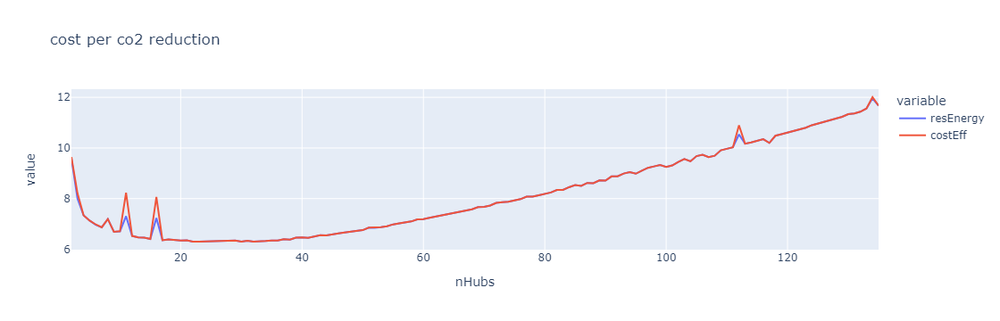

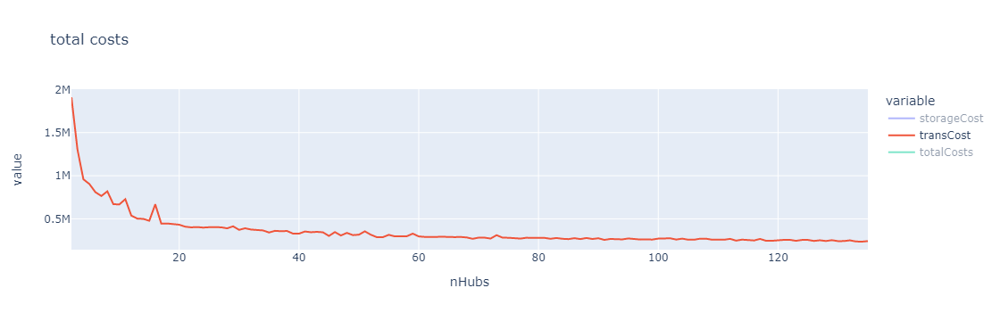

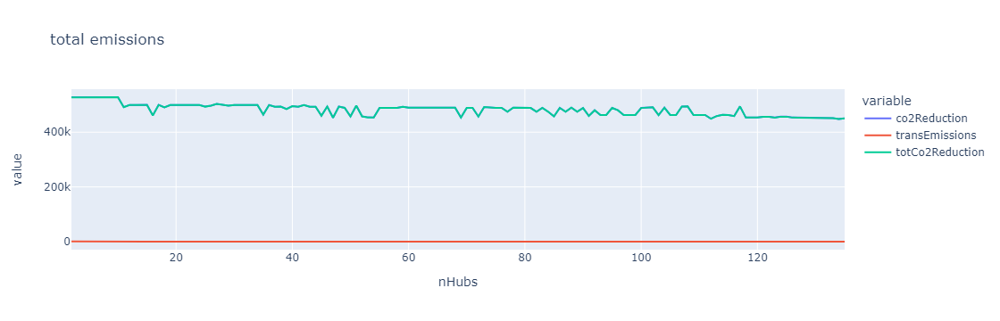

In [22]:
resEnergy_withComponents

fig = px.line(resEnergy_withComponents, x='nHubs', y=['resEnergy', 'costEff'], title='cost per co2 reduction')
fig.show()

fig = px.line(resEnergy_withComponents, x='nHubs', y=['storageCost', 'transCost', 'totalCosts'], title = 'total costs')
fig.show()

fig = px.line(resEnergy_withComponents, x='nHubs', y=['co2Reduction', 'transEmissions', 'totCo2Reduction'], title = 'total emissions')
fig.show()

# Supply and demand matching

In [8]:
# read data, coefficients
cols = ['index', 'hubName', 'x', 'y', 'nHubs', 'startTime', 'endTime']
resPointsFile = pd.read_csv('results/resPoints_230331.csv', header=None, names=cols)
resPoints = resPointsFile.copy()
resPoints = resPoints[['hubName', 'x', 'y', 'nHubs']]
resPoints.hubName = resPoints.hubName - 1
resPoints = gpd.GeoDataFrame(resPoints, geometry = gpd.points_from_xy(resPoints.x, resPoints.y), crs='EPSG:28992')

matGrid = gpd.read_file('data/matGrid_ams.shp')
candiHubs = gpd.read_file('data/candiHubs_ams.shp')
distMatrix = np.load('data/costMatrix_ams.npy')
streets = gpd.read_file('data/ams_edges.shp')

In [184]:
def calcKgReused(nHubs): 
    hubs = resPoints[resPoints.nHubs == nHubs]
    if nHubs > 80: 
        hubs = candiHubs[~candiHubs.hubName.isin(hubs.hubName.unique())]
    matGridAssigned = assignHubsToGridCells(hubs, matGrid, distMatrix)

    match = matGridAssigned.groupby('hubName').sum(numeric_only=True).reset_index()
    match['hubName'] = match.hubName.map(lambda x: str(x))
    def calcKgReused(row): 
        kgSupply = row.kgSupply
        kgDemand = row.kgDemand
        kgReused = kgSupply if kgSupply < kgDemand else kgDemand
        return kgReused
    match['kgReused'] = match.apply(lambda row: calcKgReused(row), axis=1)
    match['demandSurplus'] = match.kgDemand - match.kgSupply
    kgReused = match.kgReused.sum()
    
    return match, kgReused

In [176]:
kgReusedDict = {}
for nHubs in range(2, 135, 5): 
    print(nHubs)
    match, kgReused = calcKgReused(nHubs)
    kgReusedDict[nHubs] = kgReused

2
7
12
17
22
27
32
37
42
47
52
57
62
67
72
77
82
87
92
97
102
107
112
117
122
127
132


In [209]:
statsDf = pd.DataFrame({'nHubs': range(2, 136, 10)})
def calcStats(row): 
    nHubs = row.nHubs
    hubs = resPoints[resPoints.nHubs == nHubs]
    if nHubs > 80: 
        hubs = candiHubs[~candiHubs.hubName.isin(hubs.hubName.unique())]
    matGridAssigned = assignHubsToGridCells(hubs, matGrid, distMatrix)

    match = matGridAssigned.groupby('hubName').sum(numeric_only=True).reset_index()
    match['hubName'] = match.hubName.map(lambda x: str(x))
    def calcKgReused(row): 
        kgSupply = row.kgSupply
        kgDemand = row.kgDemand
        kgReused = kgSupply if kgSupply < kgDemand else kgDemand
        return kgReused
    match['kgReused'] = match.apply(lambda row: calcKgReused(row), axis=1)
    match['demandSurplus'] = match.kgDemand - match.kgSupply
    
    kgReused = match.kgReused.sum()
    demandSurplus = match.demandSurplus.sum()
    row['avKgDemand'] = match.kgDemand.mean()
    row['avKgSupply'] = match.kgSupply.mean()
    row['avKgReused'] = match.kgReused.mean()
    row['avDemandSurplus'] = match.demandSurplus.mean()
    
    return row
statsDf = statsDf.apply(lambda row: calcStats(row), axis=1)
statsDf

,nHubs,avKgDemand,avKgSupply,avKgReused,avDemandSurplus
0,2.0,7.132025e+08,1.736226e+08,1.736226e+08,5.395799e+08
1,12.0,1.188671e+08,2.893709e+07,2.739622e+07,8.992999e+07
2,22.0,6.483659e+07,1.578387e+07,1.493171e+07,4.905272e+07
3,32.0,4.457516e+07,1.085141e+07,1.026555e+07,3.372375e+07
4,42.0,3.396202e+07,8.267741e+06,7.821373e+06,2.569428e+07
5,52.0,2.796872e+07,6.808728e+06,5.904472e+06,2.116000e+07
6,62.0,2.338369e+07,5.692543e+06,5.281363e+06,1.769115e+07
7,72.0,2.037721e+07,4.960645e+06,4.296513e+06,1.541657e+07
8,82.0,1.805576e+07,4.395508e+06,3.954629e+06,1.366025e+07
9,92.0,1.639546e+07,3.991323e+06,3.630784e+06,1.240414e+07


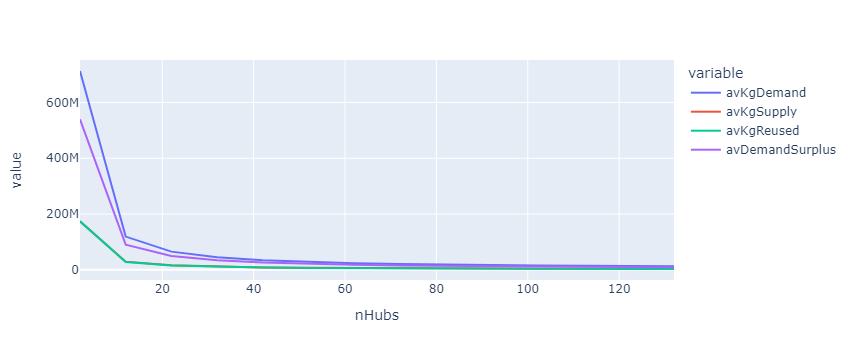

In [210]:
px.line(statsDf, x='nHubs', y=['avKgDemand', 'avKgSupply', 'avKgReused', 'avDemandSurplus'])

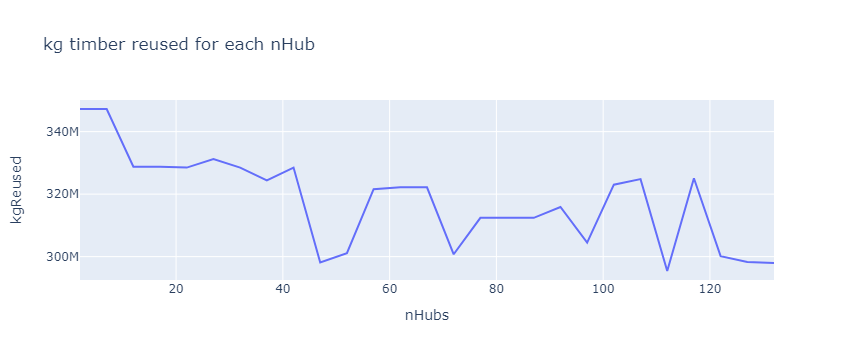

In [199]:
kgReused = pd.DataFrame({'nHubs': kgReusedDict.keys(), 'kgReused': kgReusedDict.values()})
px.line(kgReused, x='nHubs', y='kgReused', title='kg timber reused for each nHub')

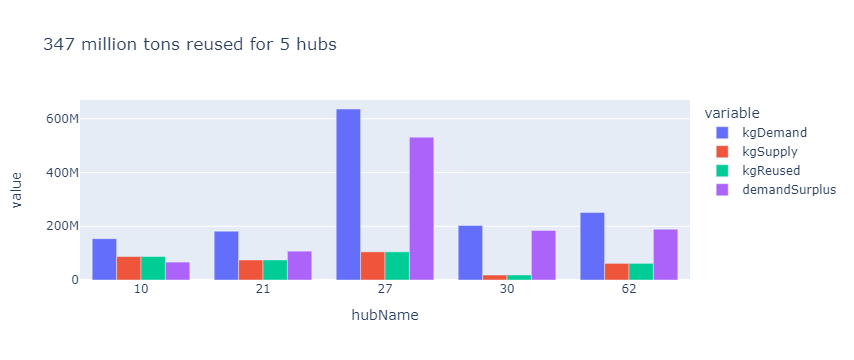

In [201]:
nHubs = 5
match, kgReused = calcKgReused(nHubs)
px.bar(match, x='hubName', y=['kgDemand', 'kgSupply', 'kgReused', 'demandSurplus'], barmode='group',
       title='{} million tons reused for {} hubs'.format(round(kgReused/1000000), nHubs))

# Calculating service areas and redundant hubs

In [27]:
tonsDemand = matGrid.kgDemand.sum() / 1000
tonsSupply = matGrid.kgSupply.sum() / 1000

tonsDemand / tonsSupply * 100

410.777545432647

In [21]:
import math
resPointsOptim = resPoints[resPoints.nHubs == 30]
matGridAssigned = assignHubsToGridCells(resPointsOptim, matGrid, distMatrix)
serviceAreas = matGridAssigned.dissolve(by='hubName')
serviceAreas.geometry = serviceAreas.geometry.convex_hull
serviceAreas['serviceArea'] = serviceAreas.geometry.area
serviceAreas['serviceRadiusKm'] = serviceAreas.serviceArea.map(lambda x: math.sqrt(x / 3.1415)/1000) 

print('av service radius: {} km'.format(round(serviceAreas.serviceRadiusKm.mean(), 2)))

av service radius: 2.89 km


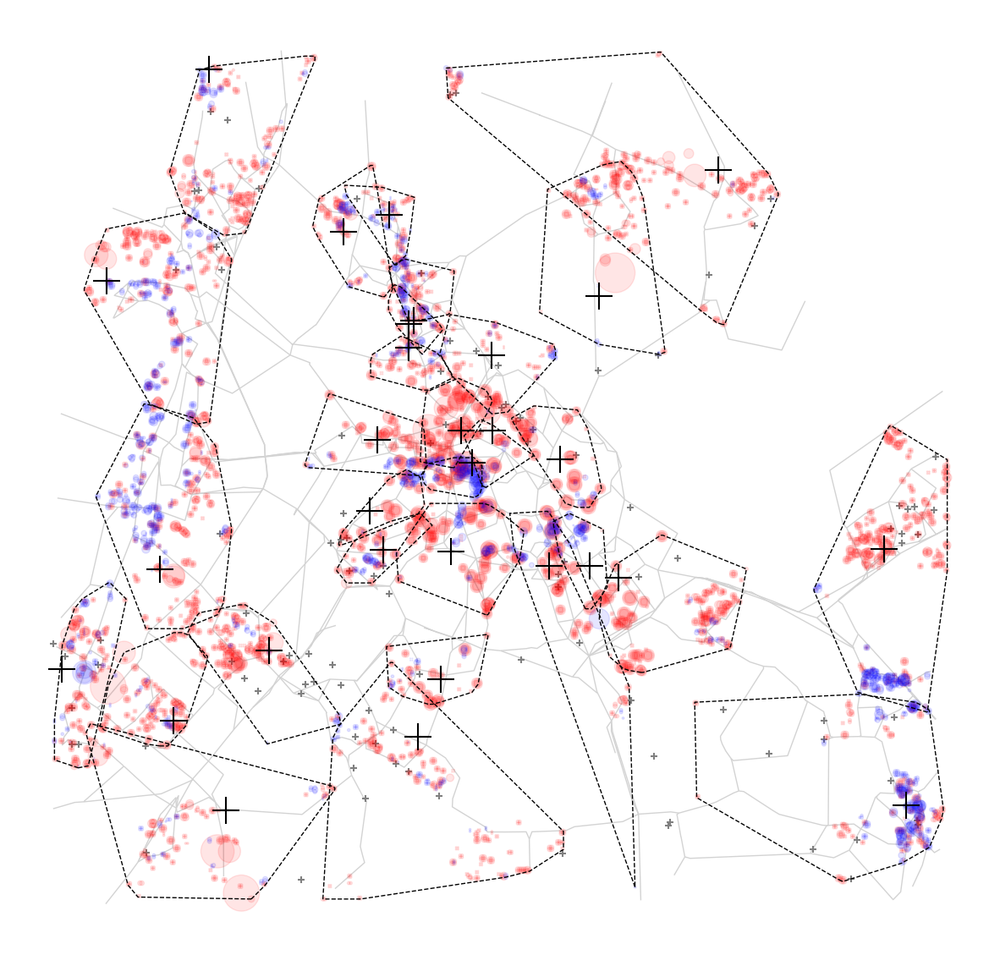

In [9]:
fig, ax = plt.subplots(1,1,figsize=(15,15))
streets.plot(color='lightgrey', zorder=-1, linewidth=1, ax=ax)
candiHubs.plot(color='grey', ax=ax, marker='+')
matGrid.plot(markersize=matGrid.kgDemand/10000, alpha=0.1, color='red', ax=ax)
matGrid.plot(markersize=matGrid.kgSupply/10000, alpha=0.1, color='blue', ax=ax)
resPointsOptim.plot(ax=ax, marker='+', color='black', markersize=500)
serviceAreas.boundary.plot(ax=ax, color='black', linestyle='dashed', linewidth=1)
ax.axis('off')
plt.show()

In [93]:
def makeStorageResults(nHubs, ssaa=True): 
    if ssaa: 
        hubs = resPoints[resPoints.nHubs == nHubs]
        if nHubs < 80: 
            hubs = candiHubs[candiHubs.hubName.isin(hubs.hubName)]
        else: 
            hubs = candiHubs[~candiHubs.hubName.isin(hubs.hubName)]
    else: 
        hubs = candiHubs.sample(nHubs)

    matGridAss = assignHubsToGridCells(hubs, matGrid, distMatrix)
    hubs, sc = calcTotStorageCost(hubs, matGridAss, candiHubs, returnHubs=True)
    hubs = hubs[['pPerSqm', 'hubName', 'geometry', 'm2', 
                 'storagePrice', 'storageCost']]
    return hubs

In [138]:
%%time
redundantHubs = pd.DataFrame({'nHubs': range(2, 136)})
def calcRedundantResults(row): 
    nHubs = row.nHubs
    print(nHubs)
    for ssaa in [True, False]: 
        hubs = makeStorageResults(nHubs, ssaa=ssaa)
        hubs['redundant'] = hubs.m2.map(lambda x: True if x == 50 else False)
        nRedundantHubs = len(hubs[hubs.redundant == True])
        text = 'ssaa' if ssaa else 'random'
        row[text] = nRedundantHubs
    return row 
redundantHubs = redundantHubs.apply(lambda row: calcRedundantResults(row), axis=1)
redundantHubs

2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
CPU times: total: 1min 50s
Wall time: 1min 50s


,nHubs,ssaa,random
0,2,0,0
1,3,0,0
2,4,0,1
3,5,0,1
4,6,0,0
...,...,...,...
129,131,109,109
130,132,110,109
131,133,111,112
132,134,113,110


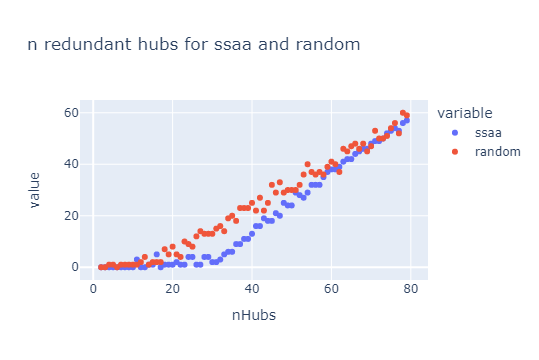

In [151]:
redundantHubs_plot = redundantHubs[(redundantHubs.nHubs > 1) & (redundantHubs.nHubs < 80)]
px.scatter(redundantHubs_plot, x='nHubs', y=['ssaa', 'random'], title='n redundant hubs for ssaa and random')

# Mapping different nHubs

In [196]:
%%time
resPoints_storageStats = pd.DataFrame(columns=['pPerSqm', 'hubName', 'geometry', 
                                               'm2', 'storagePrice', 'storageCost', 
                                               'redundant', 'nHubs'])
for nHubs in range(2, 136): 
    hubs = makeStorageResults(nHubs, ssaa=True)
    hubs['redundant'] = hubs.m2.map(lambda x: True if x == 50 else False)
    hubs['nHubs'] = nHubs
    resPoints_storageStats = pd.concat([resPoints_storageStats, hubs])
    
resPoints_storageStats

C:\Users\tpytsui\Miniconda\envs\geo_env\Lib\site-packages\geopandas\array.py:1406: UserWarning:

CRS not set for some of the concatenation inputs. Setting output's CRS as Amersfoort / RD New (the single non-null crs provided).

<timed exec>:8: FutureWarning:

In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.

<timed exec>:8: FutureWarning:

In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.

<timed exec>:8: FutureWarning:

In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.

<timed exec>:8: FutureWarning:

In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.

<timed e

CPU times: total: 51.6 s
Wall time: 53.2 s


<timed exec>:8: FutureWarning:

In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.



,pPerSqm,hubName,geometry,m2,storagePrice,storageCost,redundant,nHubs
96,338.994532,96,POINT (131728.788 476037.226),1943.784626,588.994532,1.144879e+06,False,2
98,276.731888,98,POINT (110736.062 477321.249),3845.949894,526.731888,2.025784e+06,False,2
37,257.195438,37,POINT (114646.449 484056.096),2965.781223,507.195438,1.504231e+06,False,3
95,318.223459,95,POINT (138160.757 467512.281),1439.322503,568.223459,8.178568e+05,False,3
112,254.062937,112,POINT (121917.655 489519.124),1384.630794,504.062937,6.979411e+05,False,3
...,...,...,...,...,...,...,...,...
134,265.779341,134,POINT (110501.319 467459.346),50.000000,515.779341,2.578897e+04,True,135
135,186.333125,135,POINT (100415.196 479516.579),62.182253,436.333125,2.713218e+04,False,135
136,287.269338,136,POINT (98973.109 474291.608),50.000000,537.269338,2.686347e+04,True,135
137,279.247042,137,POINT (106723.743 470972.440),50.000000,529.247042,2.646235e+04,True,135


## Make gif

C:\Users\tpytsui\Miniconda\envs\geo_env\Lib\site-packages\geopandas\plotting.py:693: UserWarning:

The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.

C:\Users\tpytsui\Miniconda\envs\geo_env\Lib\site-packages\geopandas\plotting.py:693: UserWarning:

The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.



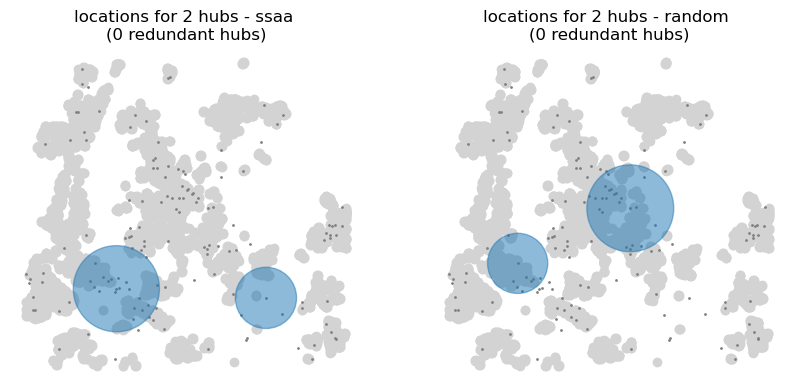

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.

C:\Users\tpytsui\Miniconda\envs\geo_env\Lib\site-packages\geopandas\plotting.py:693: UserWarning:

The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.

C:\Users\tpytsui\Miniconda\envs\geo_env\Lib\site-packages\geopandas\plotting.py:693: UserWarning:

The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.



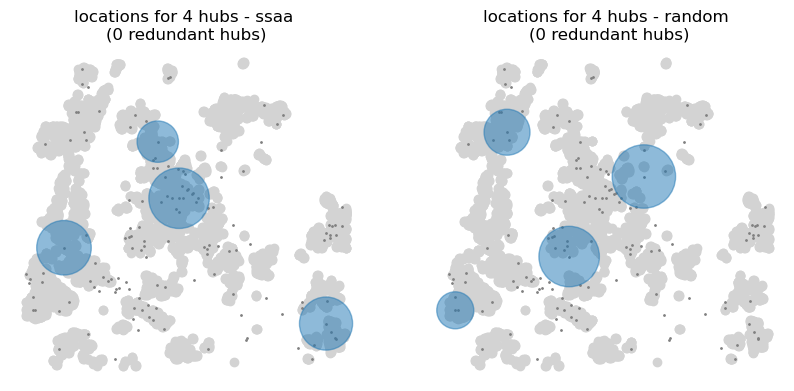

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.

C:\Users\tpytsui\Miniconda\envs\geo_env\Lib\site-packages\geopandas\plotting.py:693: UserWarning:

The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.



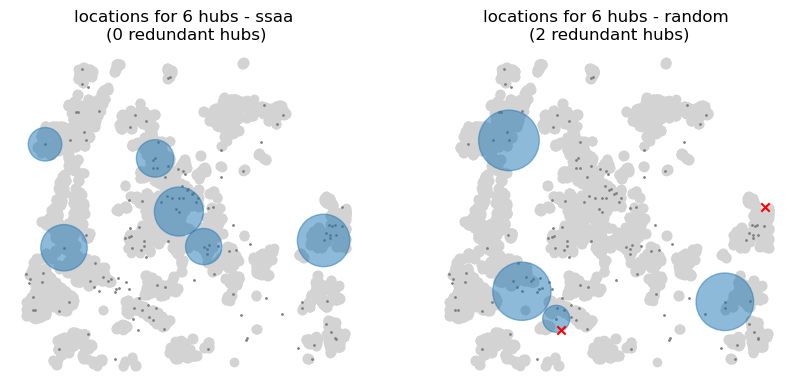

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.

C:\Users\tpytsui\Miniconda\envs\geo_env\Lib\site-packages\geopandas\plotting.py:693: UserWarning:

The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.



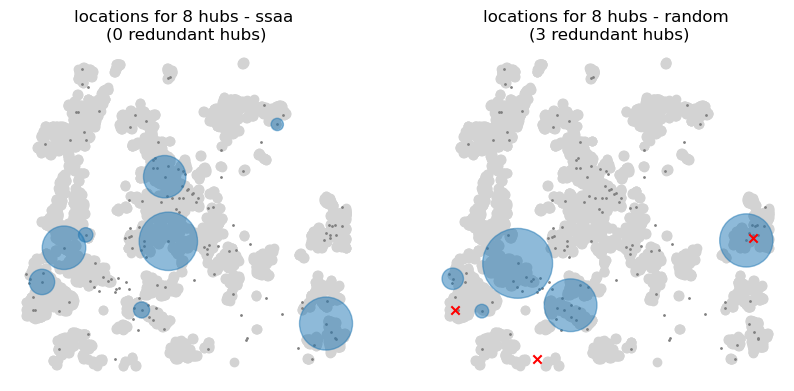

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.

C:\Users\tpytsui\Miniconda\envs\geo_env\Lib\site-packages\geopandas\plotting.py:693: UserWarning:

The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.



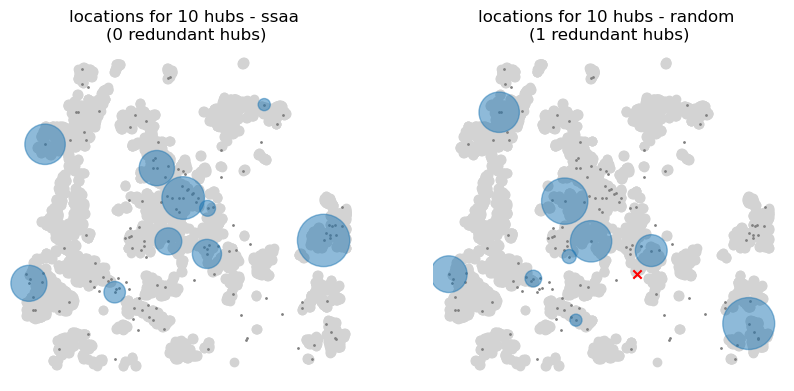

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.

C:\Users\tpytsui\Miniconda\envs\geo_env\Lib\site-packages\geopandas\plotting.py:693: UserWarning:

The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.



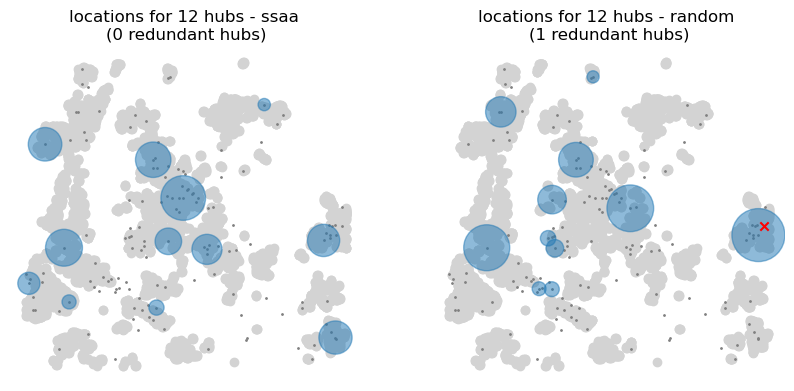

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



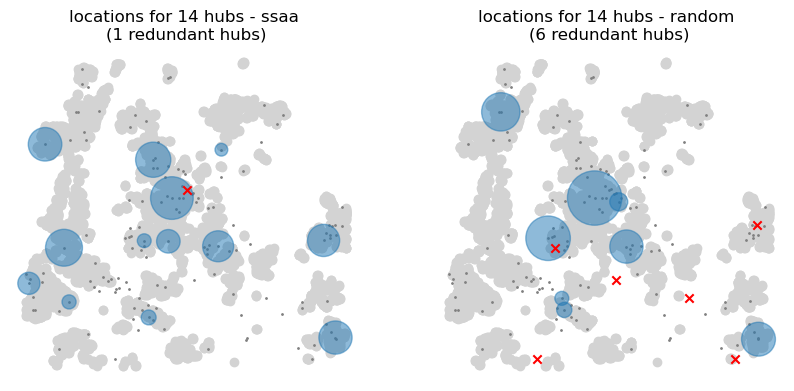

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



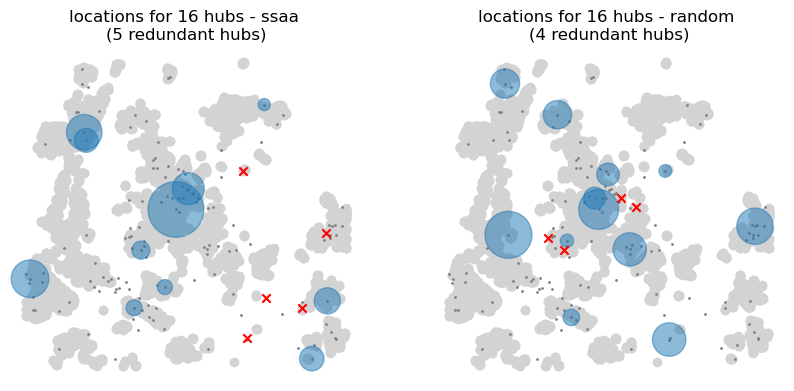

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



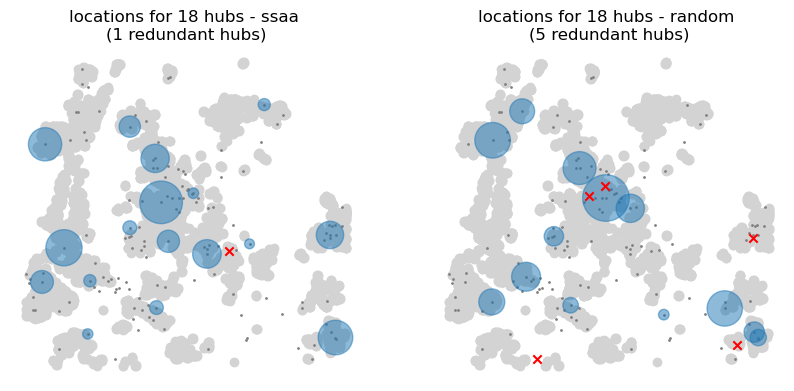

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



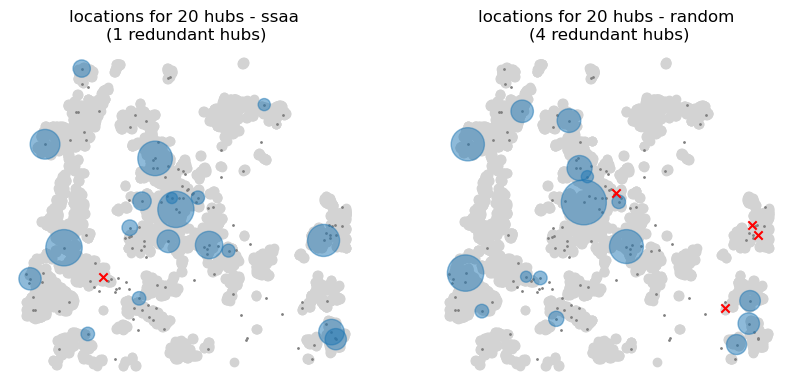

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



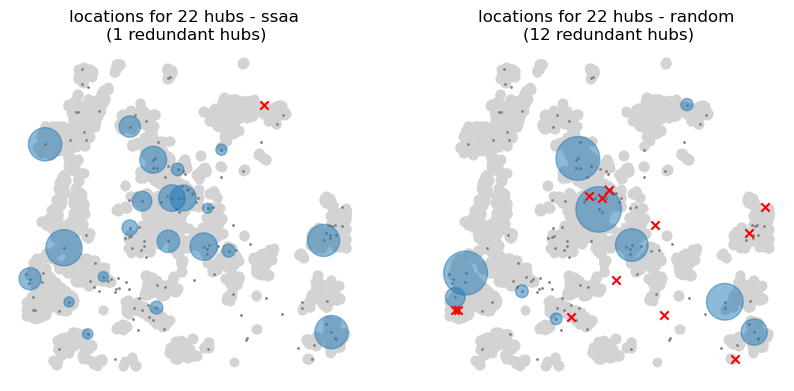

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



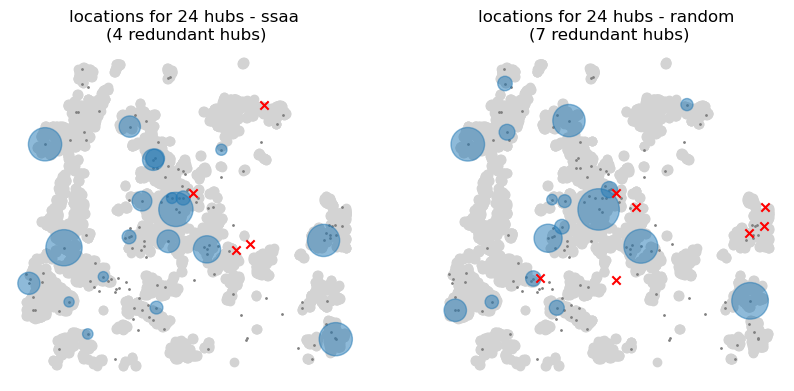

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



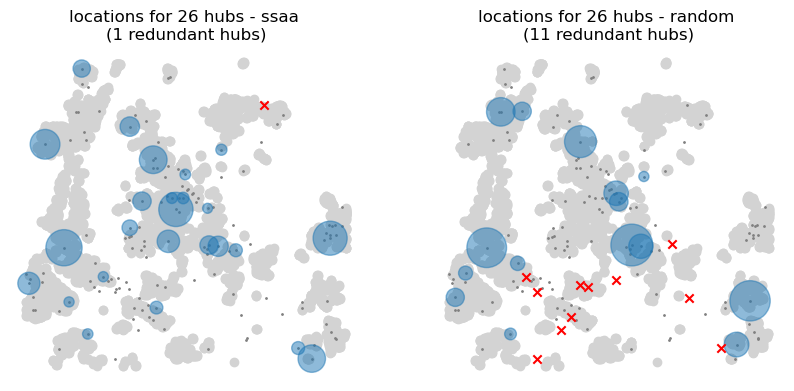

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



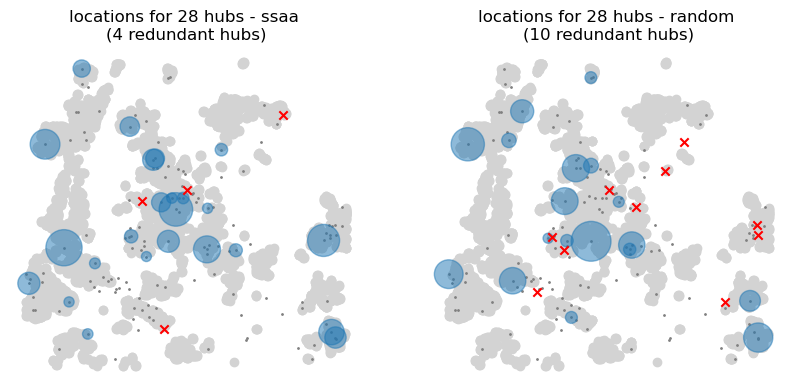

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



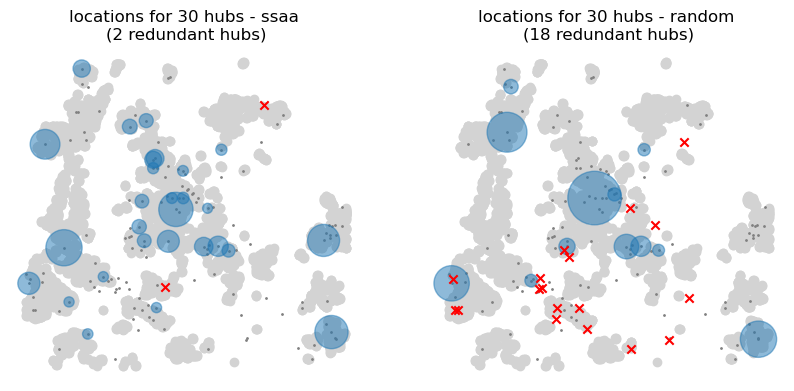

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



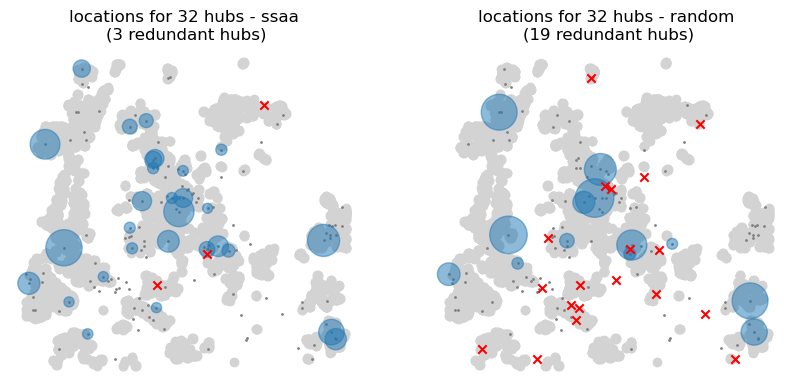

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



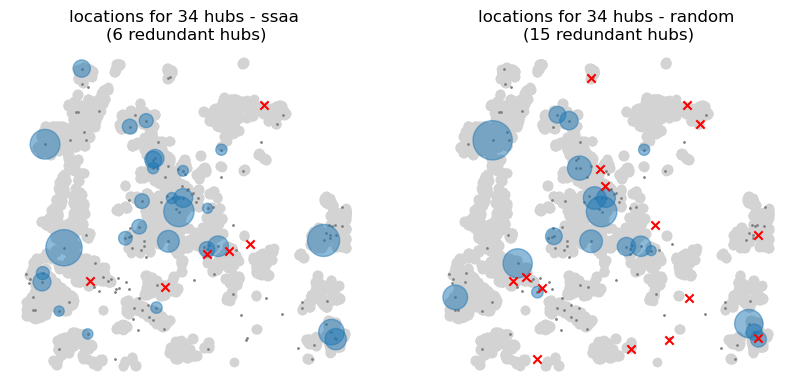

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



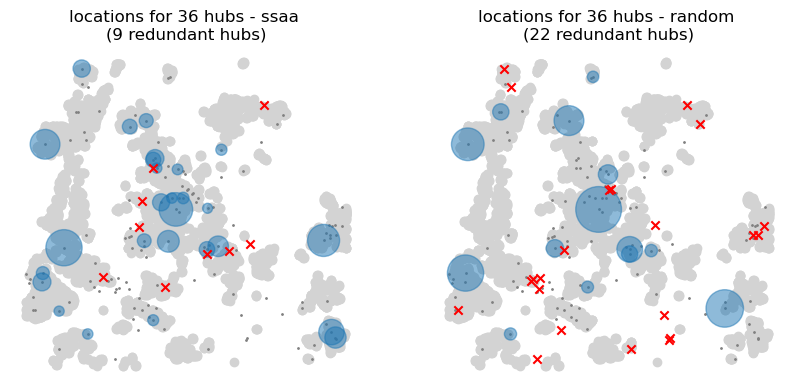

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



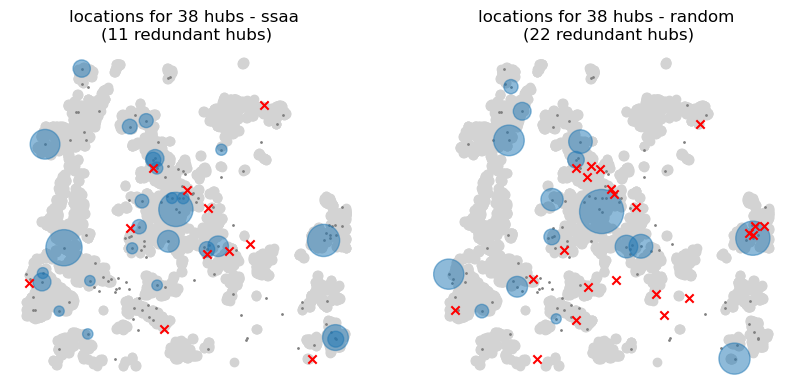

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



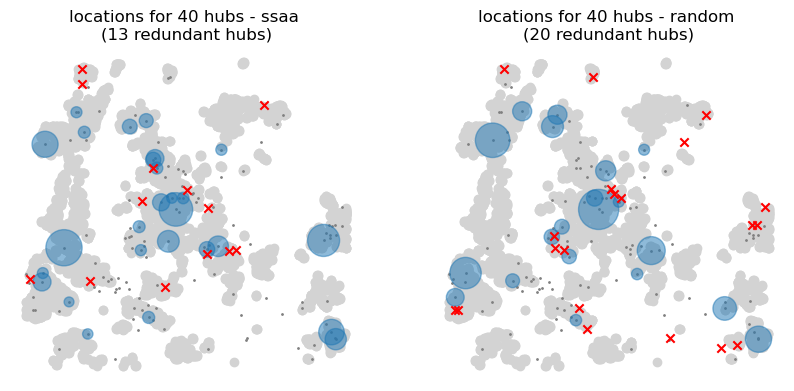

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



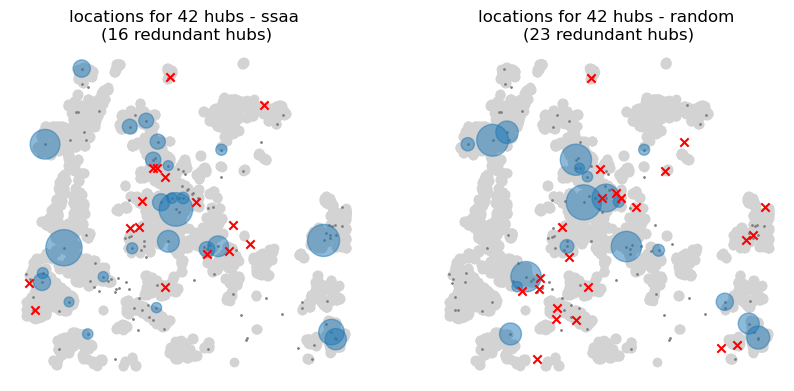

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



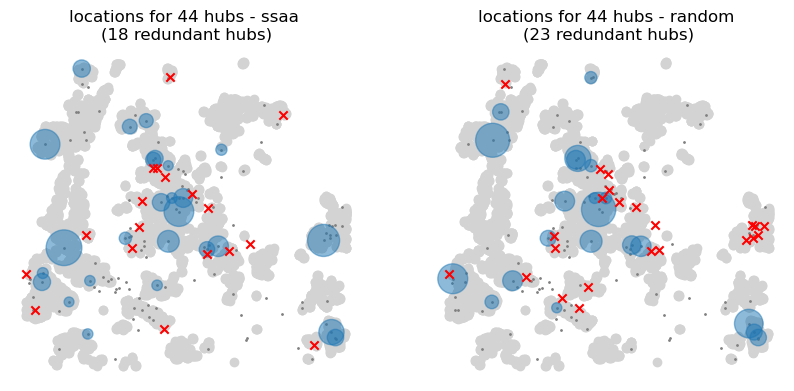

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



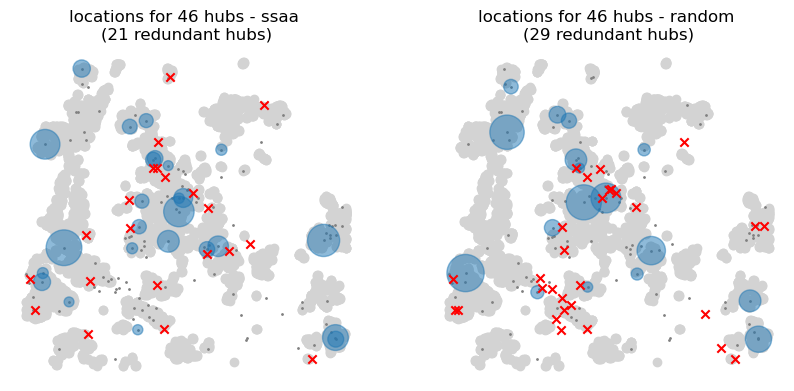

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



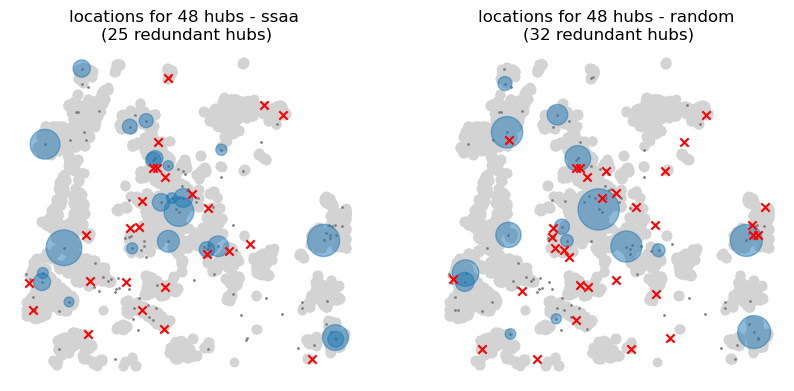

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



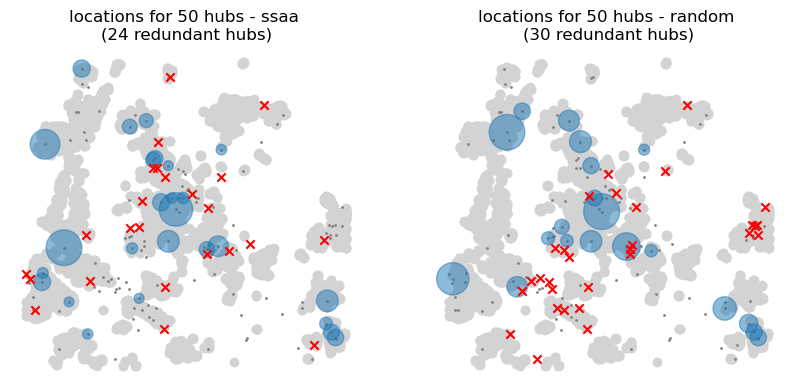

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



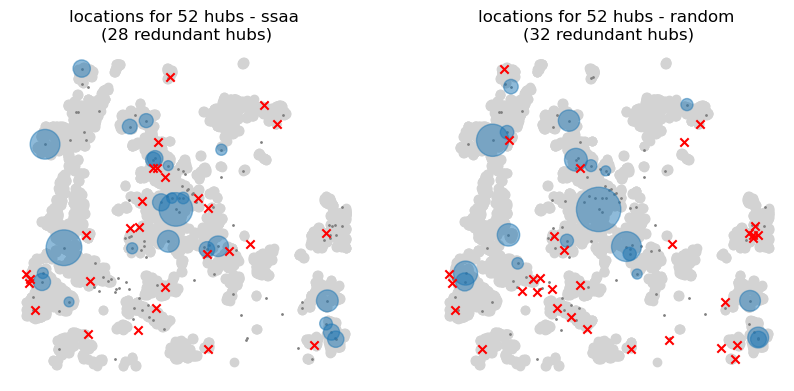

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



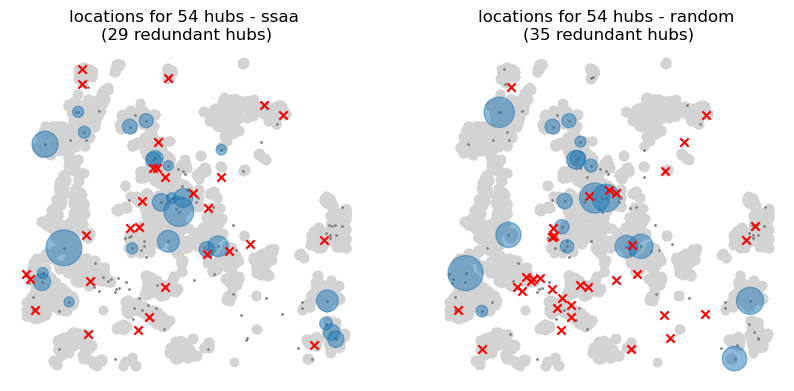

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



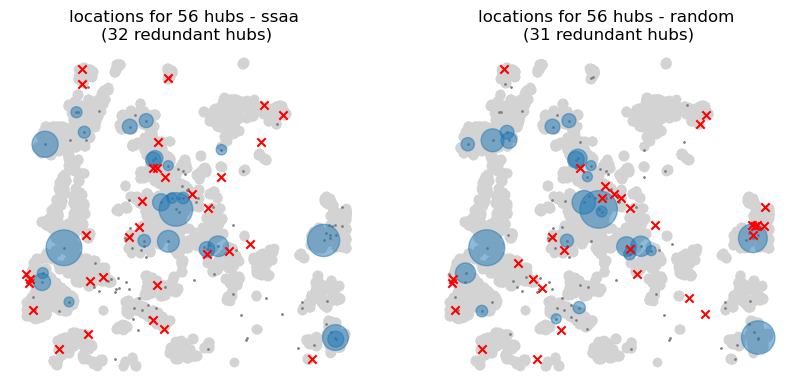

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



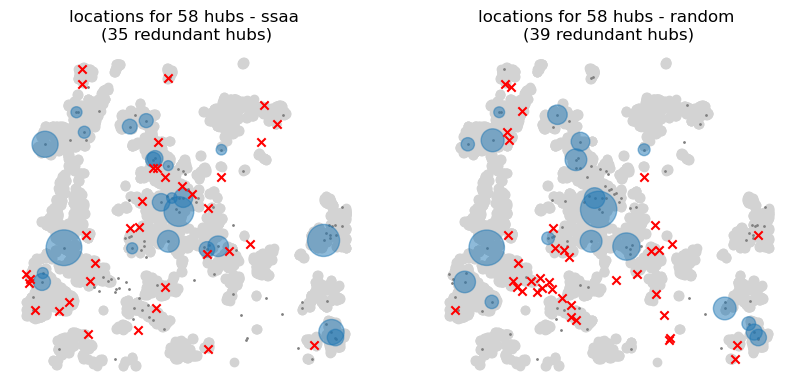

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



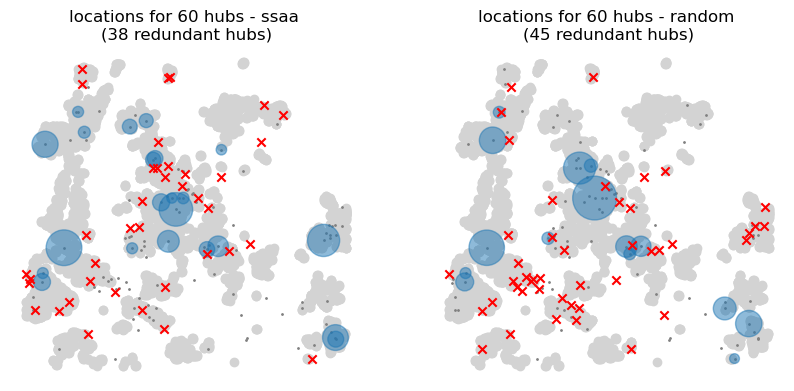

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



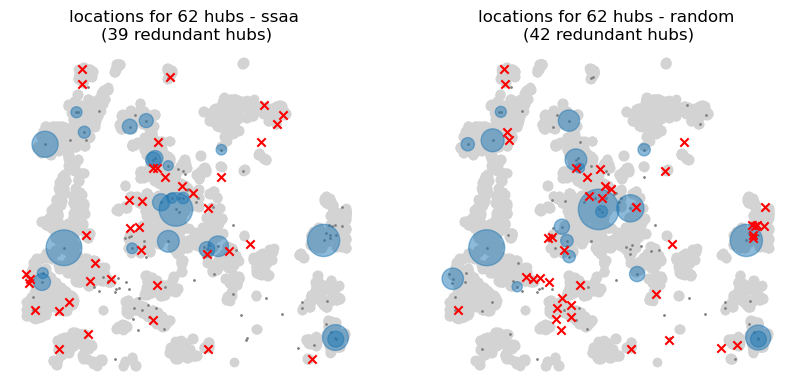

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



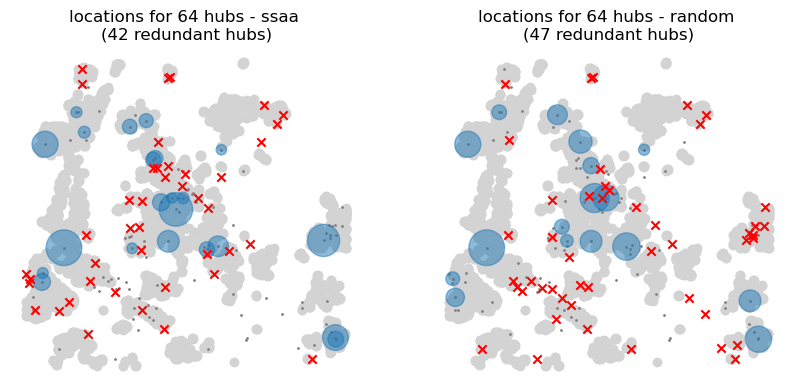

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



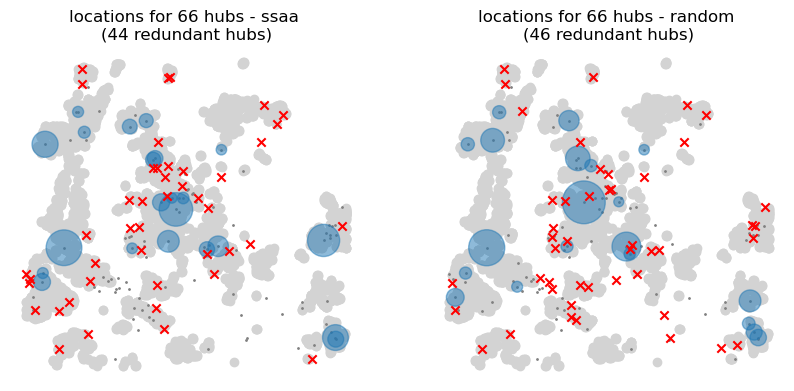

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



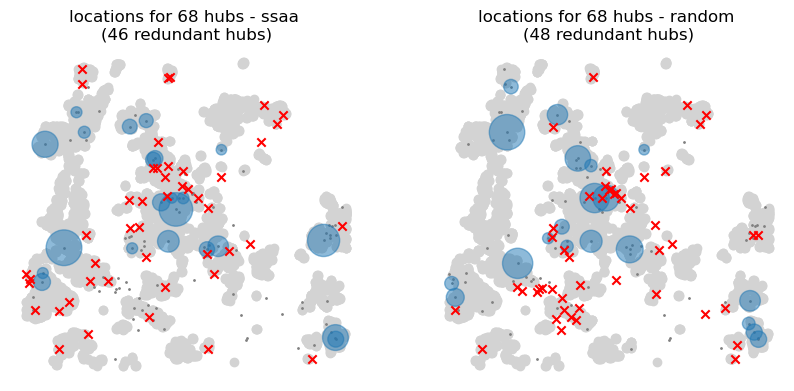

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



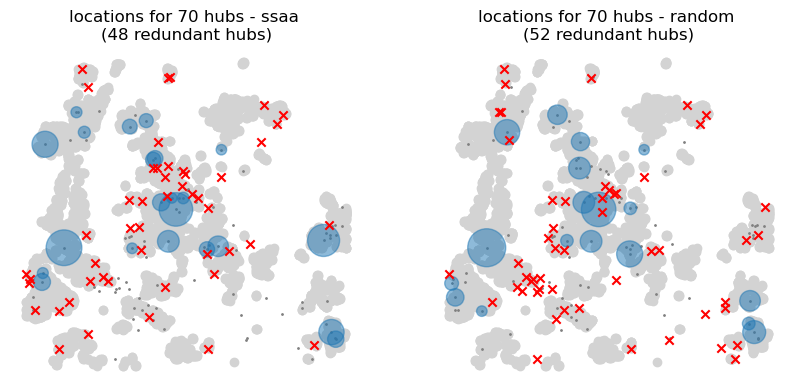

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



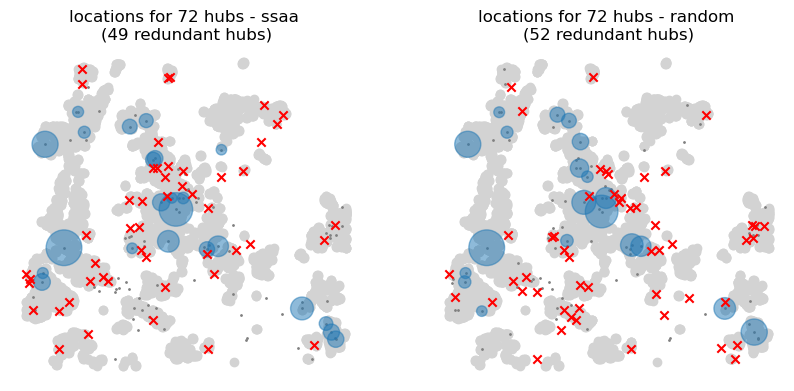

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



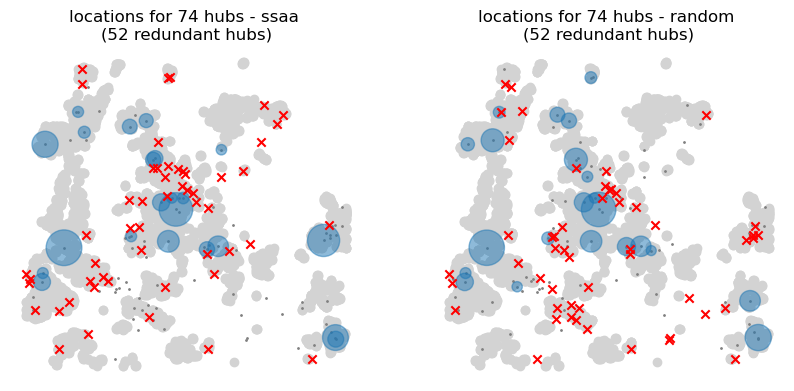

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



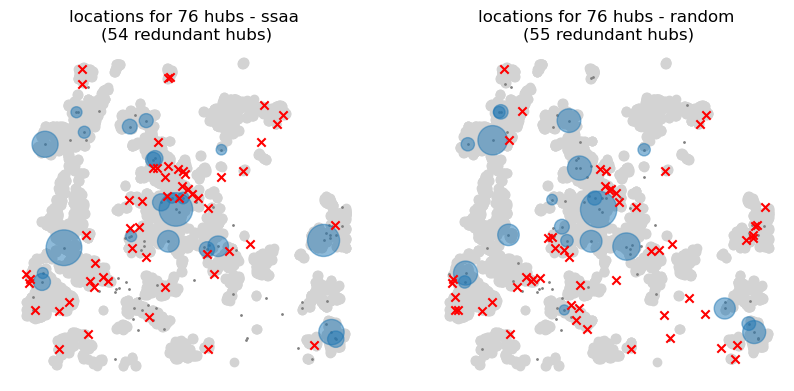

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



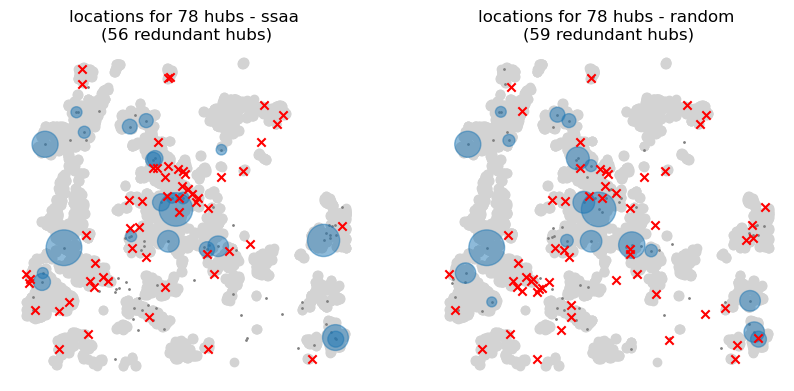

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



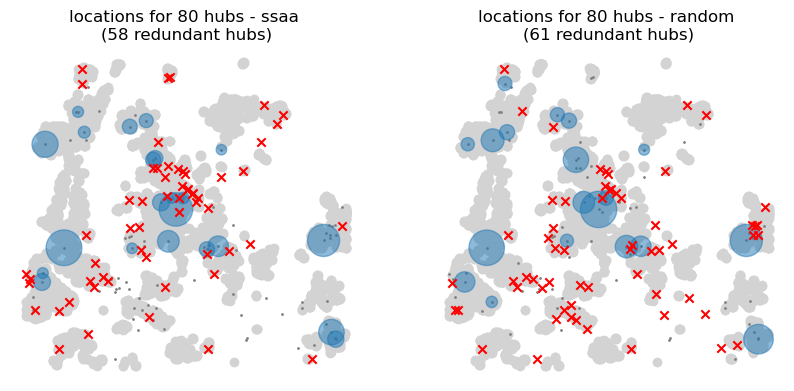

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



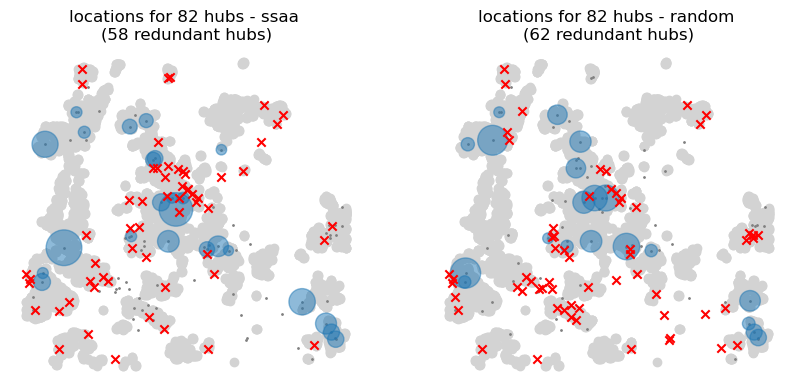

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



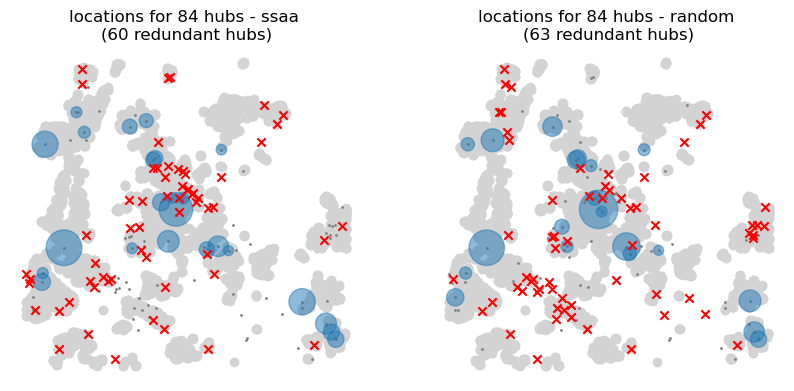

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



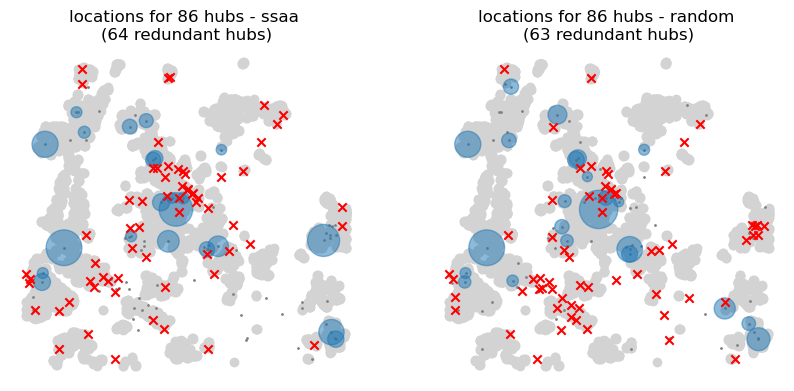

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



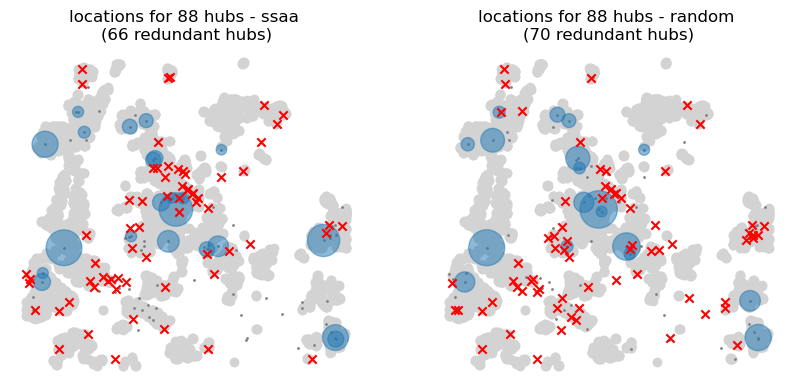

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



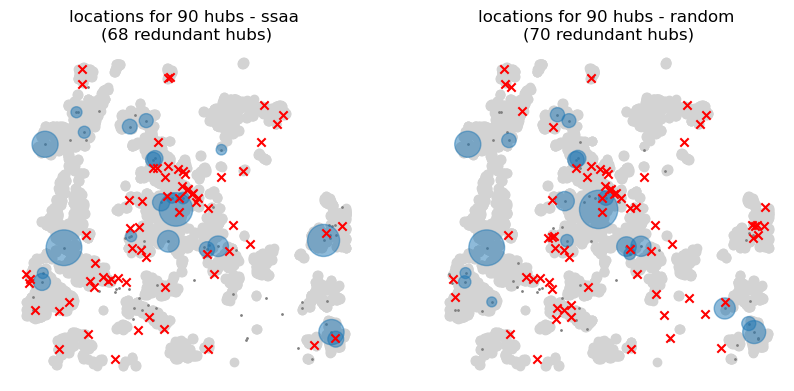

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



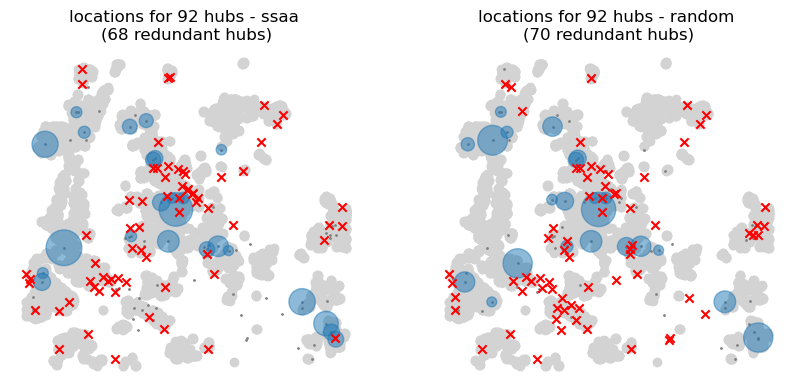

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



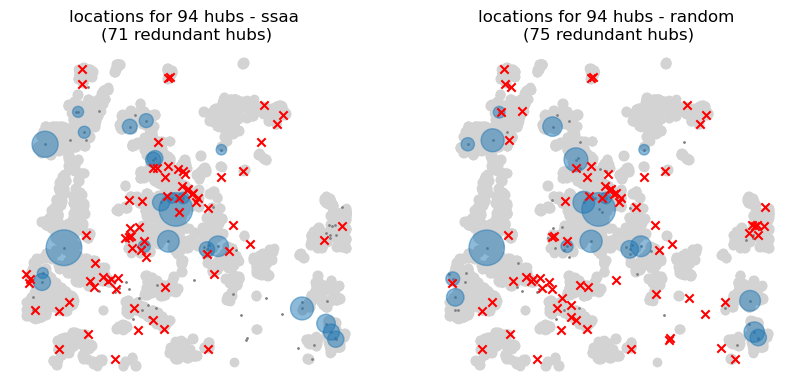

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



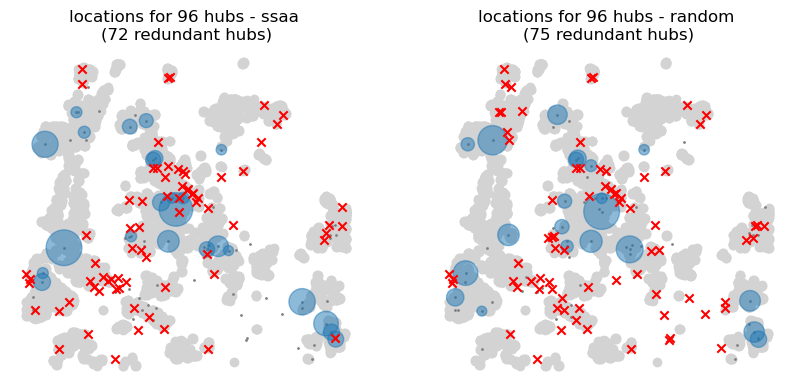

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



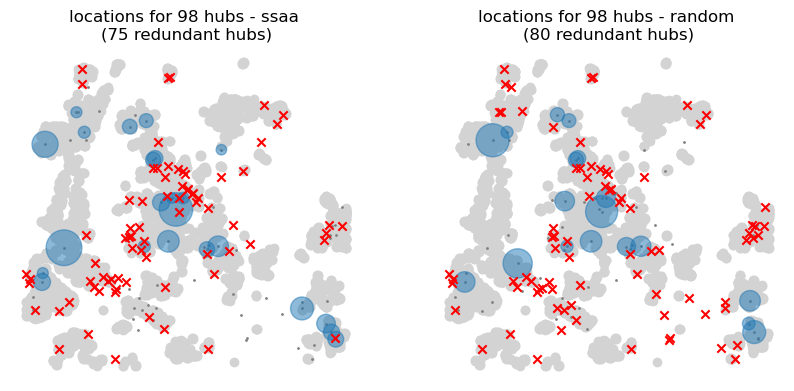

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



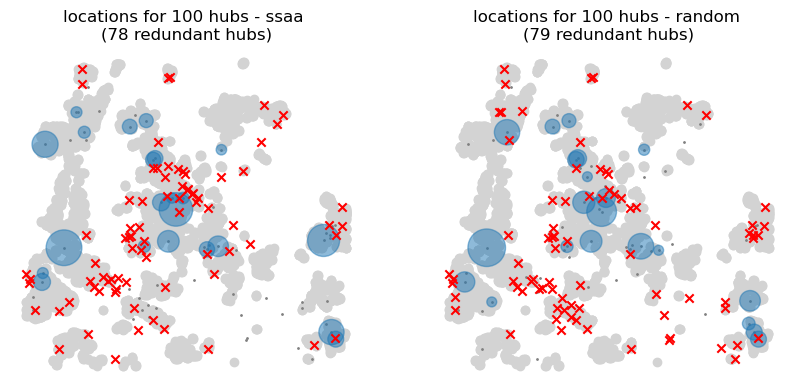

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



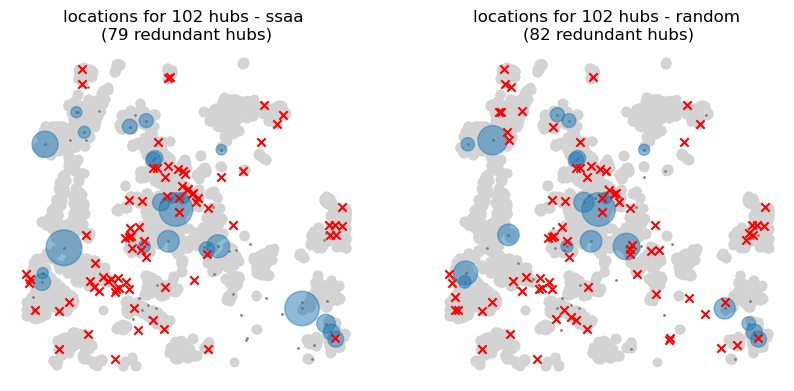

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



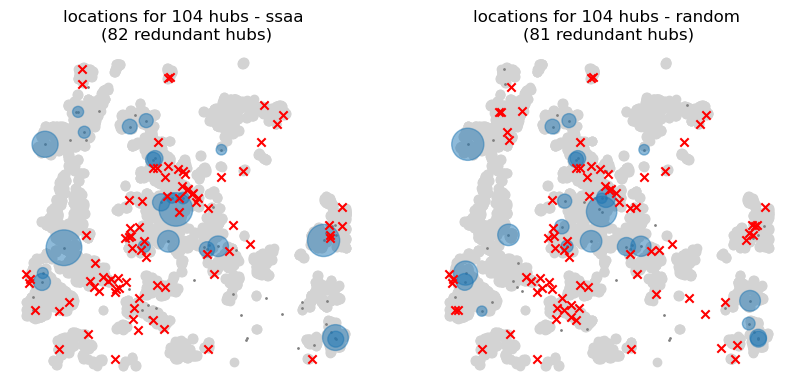

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



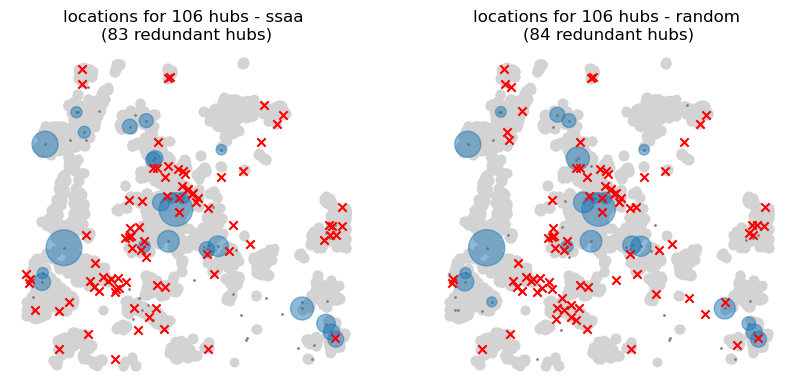

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



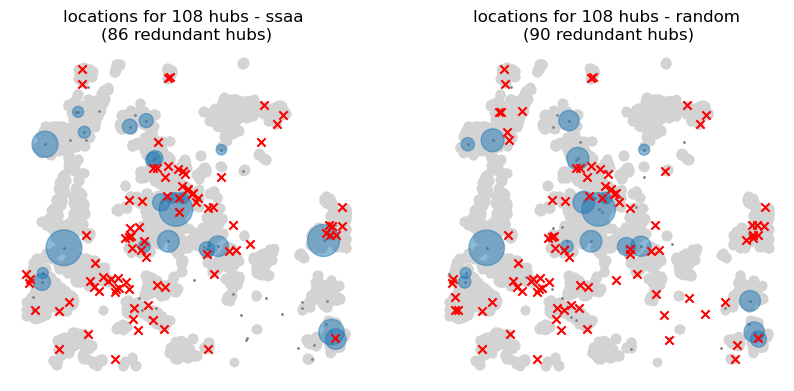

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



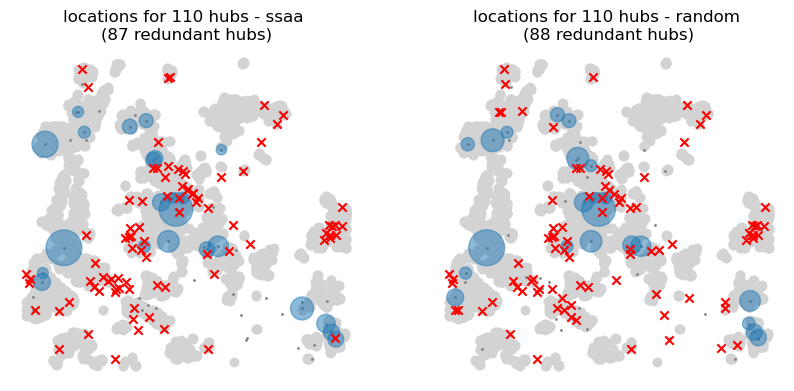

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



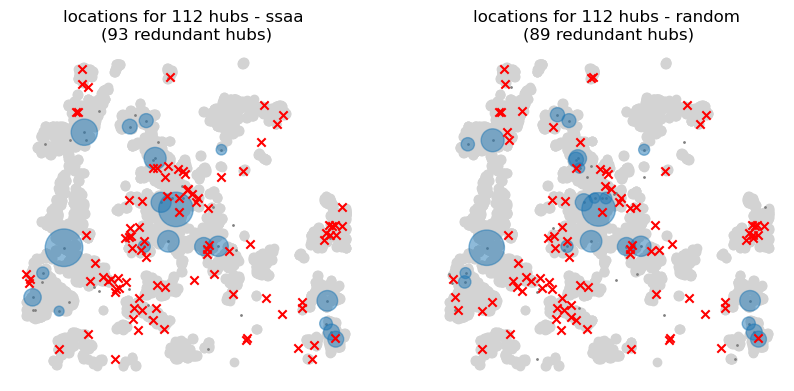

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



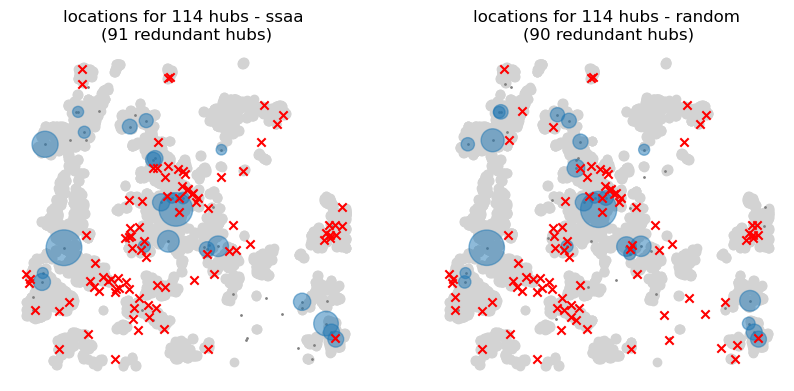

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



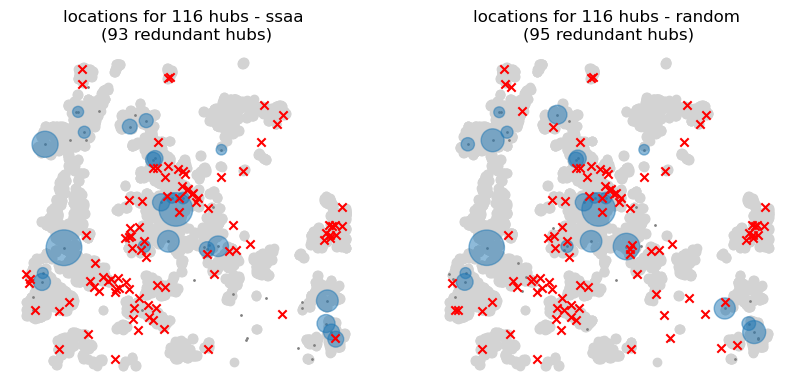

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



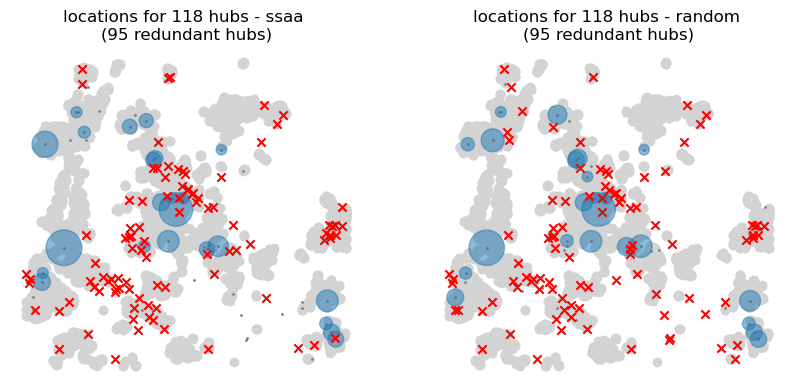

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



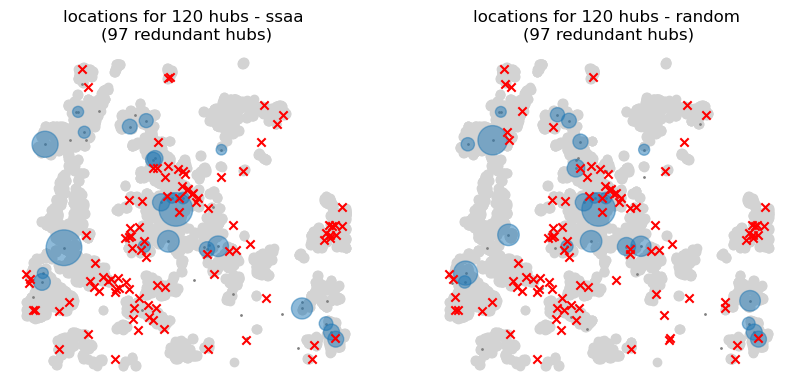

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



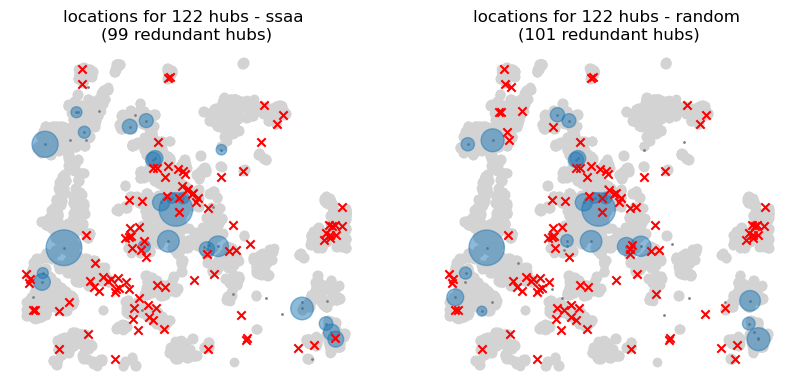

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



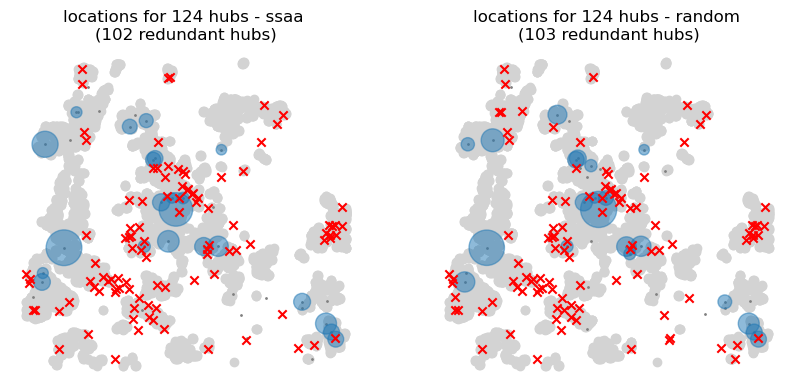

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



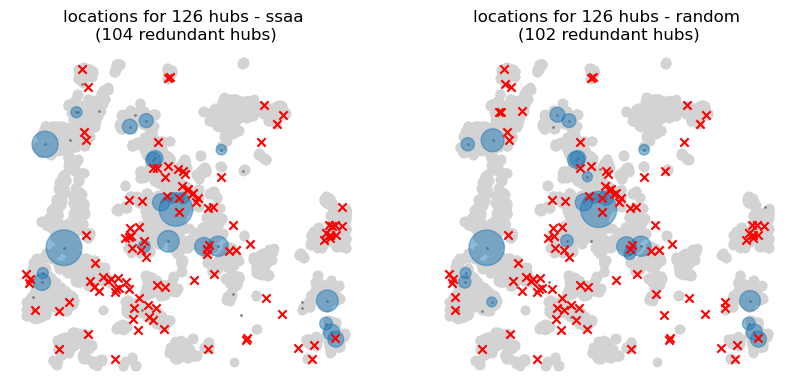

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



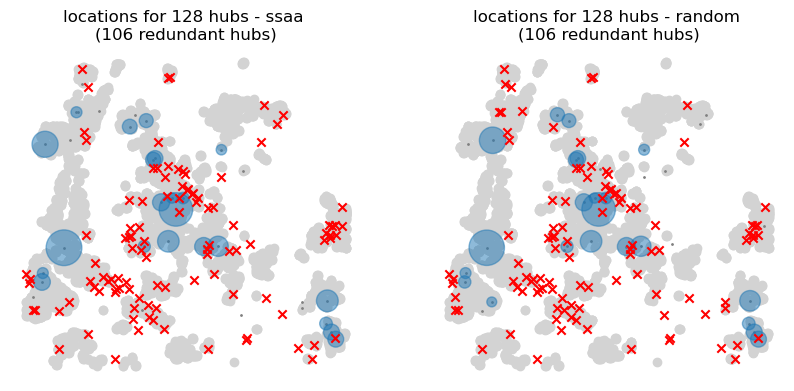

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



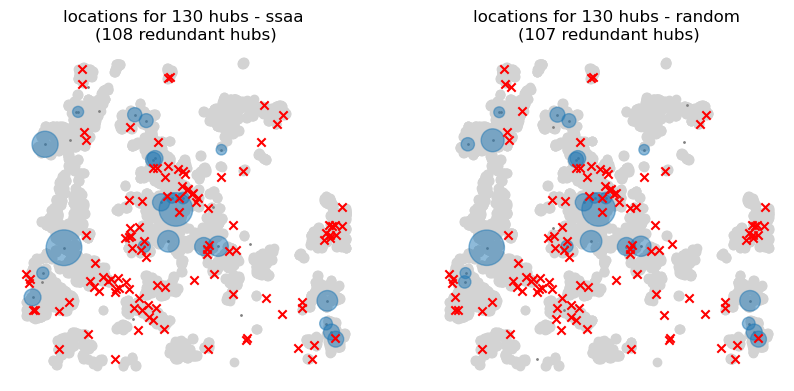

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



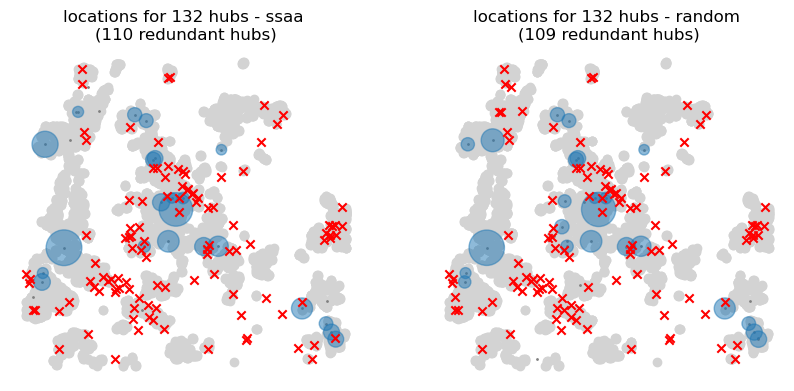

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



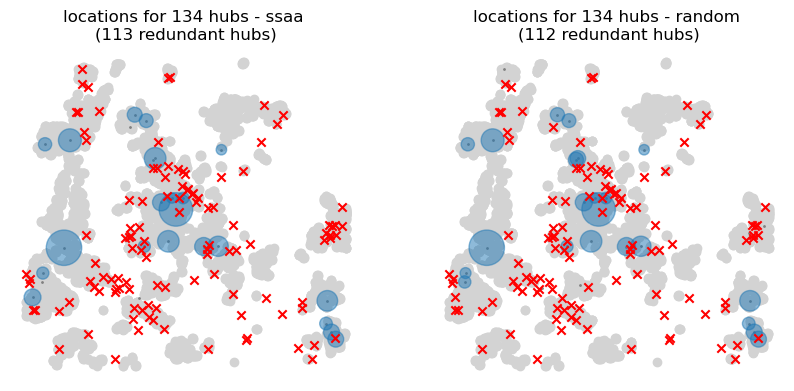

<timed exec>:26: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



CPU times: total: 2min 56s
Wall time: 2min 58s


In [168]:
%%time
import imageio
images = []
for nHubs in range(2, 135, 2): 
    fig, ax = plt.subplots(1,2, figsize=(10,8))

    for i, ssaa in enumerate([True, False]): 
        # make hubs 
        hubs = makeStorageResults(nHubs, ssaa=ssaa)
        hubs['redundant'] = hubs.m2.map(lambda x: True if x == 50 else False)
        hubs_inUse = hubs[hubs.redundant == False]
        hubs_redundant = hubs[hubs.redundant == True]

        # plot hubs
        matGrid.plot(color='lightgrey', ax=ax[i])
        candiHubs.plot(ax=ax[i], color='grey', markersize=1)
        hubs_inUse.plot(markersize=hubs_inUse.m2, alpha=0.5, ax=ax[i])
        hubs_redundant.plot(ax=ax[i], marker='x', color='red')

        # adjust text 
        titleText = 'ssaa' if ssaa else 'random'
        ax[i].set_title('locations for {} hubs - {} \n({} redundant hubs)'.format(nHubs, titleText, len(hubs_redundant)))
        ax[i].axis('off')

    plt.show()
    fig.savefig('results/gif/{}.png'.format(nHubs))
    images.append(imageio.imread('results/gif/{}.png'.format(nHubs)))

imageio.mimsave('results/gif/test.gif', images, fps=1)

## Overlaying all solutions

In [276]:
resPoints_inUse = resPoints_storageStats[resPoints_storageStats.redundant == False]
resPoints_inUse = gpd.GeoDataFrame(resPoints_inUse, crs = 'EPSG:28992')
resPoints_inUse = resPoints_inUse.to_crs('EPSG:4326')

In [223]:
import folium
from folium import plugins
map = folium.Map(location=[52.37517620709537, 4.898590508328429], tiles="Cartodb dark_matter", zoom_start=10)
heat_data = [[point.xy[1][0], point.xy[0][0]] for point in resPoints_inUse.geometry]
plugins.HeatMap(heat_data).add_to(map)
map

In [298]:
# count number of times hubs are chosen
resPoints_inUse_count = resPoints_inUse
resPoints_inUse_count = resPoints_inUse_count.groupby('hubName').count().geometry.reset_index()
resPoints_inUse_count.rename(columns={'geometry': 'count_'}, inplace=True)
temp = resPoints_inUse[['hubName', 'geometry']].drop_duplicates()
resPoints_inUse_count = resPoints_inUse_count.merge(temp)
resPoints_inUse_count = gpd.GeoDataFrame(resPoints_inUse_count)

# extract hubs that are always redundant
chosenHubs = resPoints_inUse_count.hubName.unique()
resPoints_redundant = resPoints_storageStats[~resPoints_storageStats.hubName.isin(chosenHubs)][['hubName', 'geometry']].drop_duplicates()
resPoints_redundant = gpd.GeoDataFrame(resPoints_redundant, crs='EPSG:28992').to_crs('EPSG:4326')

# map
m = folium.Map(location=[52.37517620709537, 4.898590508328429], tiles="Cartodb dark_matter", zoom_start=10)
for _, row in resPoints_inUse_count.iterrows(): 
    hubName = row.hubName
    count = row.count_
    x = row.geometry.x
    y = row.geometry.y
    
    folium.Circle(
        radius=count*15,
        location=[y,x],
        popup='hub #{}, picked {} times'.format(hubName, count),
        color="crimson",
        fill=True,
    ).add_to(m)
    
for _, row in resPoints_redundant.iterrows():
    hubName = row.hubName
    x = row.geometry.x
    y = row.geometry.y

    folium.Circle(
        radius=10,
        location=[y,x],
        popup='hub #{}, redundant'.format(hubName),
        color="gray",
        fill=True,
    ).add_to(m)
    
m

# Backup

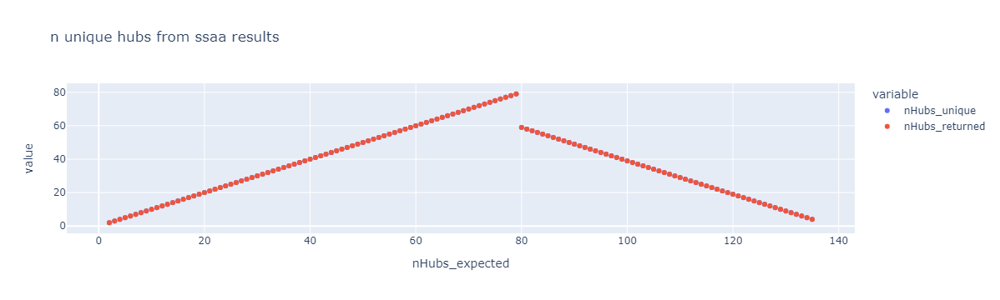

In [17]:
resPoints = resPoints.sort_values('nHubs')
resPoints_count = resPoints.groupby('nHubs').count().hubName.reset_index()
resPoints_count.rename(columns={'nHubs': 'nHubs_expected', 'hubName': 'nHubs_returned'}, inplace=True)
def calcNUniqueHubs(x): 
    temp = resPoints[resPoints.nHubs == x]
    nUniqueHubs = len(temp.hubName.unique())
    return nUniqueHubs
resPoints_count['nHubs_unique'] = resPoints_count.nHubs_expected.map(lambda x: calcNUniqueHubs(x))
resPoints_count

px.scatter(resPoints_count, x='nHubs_expected', y=['nHubs_unique', 'nHubs_returned'], title='n unique hubs from ssaa results')

## Res points

In [7]:
matGrid = gpd.read_file('data/matGrid_ams.shp')
candiHubs = gpd.read_file('data/candiHubs_ams.shp')

In [8]:
# read resPoints
cols = ['index', 'hubName', 'x', 'y', 'nHubs', 'startTime', 'endTime']
resPoints = pd.read_csv('results/resPoints_230331.csv', header=None, names=cols)
resPoints.startTime = resPoints.startTime.map(lambda x: datetime.strptime(x, '%Y-%m-%d %H:%M:%S'))
resPoints.endTime = resPoints.endTime.map(lambda x: datetime.strptime(x, '%Y-%m-%d %H:%M:%S'))
resPoints.hubName = resPoints.hubName - 1 
resPoints = gpd.GeoDataFrame(resPoints, geometry = gpd.points_from_xy(x=resPoints.x, y=resPoints.y, crs='EPSG:28992'))

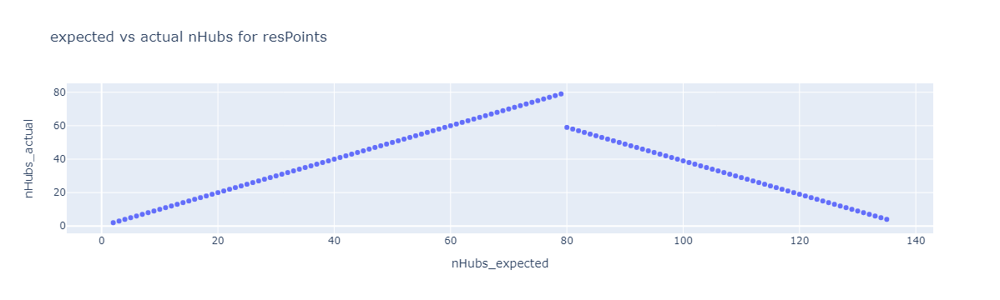

In [9]:
nHubs_actual_dict = {}
for nHubs in resPoints.nHubs.unique(): 
    test = resPoints[resPoints.nHubs == nHubs]
    if len(test) > nHubs: 
        test = test.iloc[-nHubs:]
    nHubs_actual = len(test.hubName.unique())
    nHubs_actual_dict[nHubs] = nHubs_actual

# plot
nHubsCompare = pd.DataFrame({'nHubs_expected': nHubs_actual_dict.keys(), 'nHubs_actual': nHubs_actual_dict.values()})
px.scatter(nHubsCompare, 'nHubs_expected', 'nHubs_actual', title='expected vs actual nHubs for resPoints')

## Running different storage scenarios

### min storage sqm = 50 

In [34]:
hubs_array = np.array(candiHubs.hubName)
costEff = calcTotCostEffectiveness_r(hubs_array, runInR=False)
print(costEff)

12.296296748630224


In [42]:
%%time
costEffDict = {}
for nHubs in range(2, 140):
    if nHubs < 80: 
        nHubs_adjusted = nHubs
        reverse = False
    else: 
        nHubs_adjusted = 139 - nHubs
        reverse = True
    hubs = candiHubs.sample(nHubs_adjusted)
    hubs_array = np.array(hubs.hubName)
    costEff = calcTotCostEffectiveness_r(hubs_array, runInR=False, reverse=reverse)
    costEffDict[nHubs] = costEff
    print('costEff for {}: {}'.format(nHubs, costEff))

costEff for 2: 8.368713698652098
costEff for 3: 9.183153340352968
costEff for 4: 8.290677725068049
costEff for 5: 8.275885947024397
costEff for 6: 8.147675484492261
costEff for 7: 9.797912300824935
costEff for 8: 7.477637026198293
costEff for 9: 8.111400972016622
costEff for 10: 8.134980829154298
costEff for 11: 7.523987986978673
costEff for 12: 7.502649596163695
costEff for 13: 7.4964011301565545
costEff for 14: 7.292208215355176
costEff for 15: 7.46867217027395
costEff for 16: 7.7817610884170625
costEff for 17: 7.245050918418233
costEff for 18: 7.118854284867964
costEff for 19: 7.310834793195109
costEff for 20: 7.280219660352381
costEff for 21: 7.51277812445473
costEff for 22: 7.504276914588357
costEff for 23: 7.736169755178154
costEff for 24: 7.3657595786423595
costEff for 25: 7.3816677814253815
costEff for 26: 7.375149656643869
costEff for 27: 7.211757381854891
costEff for 28: 7.307575219049104
costEff for 29: 7.171313652822827
costEff for 30: 7.374792982391644
costEff for 31: 7.75

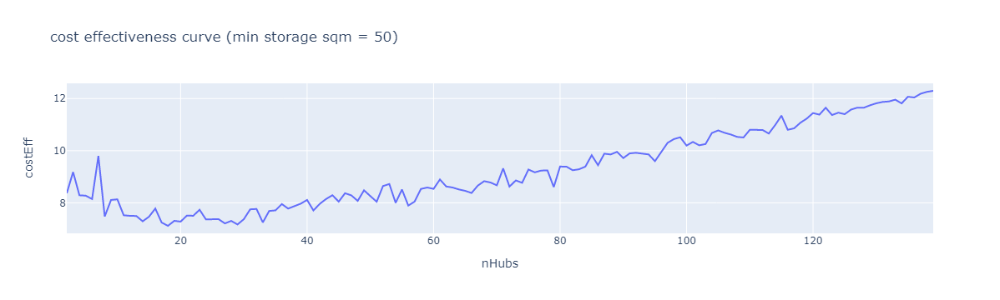

In [43]:
costEff = pd.DataFrame.from_dict(costEffDict, orient='index').reset_index()
costEff.rename(columns={'index': 'nHubs', 0: 'costEff'}, inplace=True)
px.line(costEff, 'nHubs', 'costEff', title='cost effectiveness curve (min storage sqm = 50)')

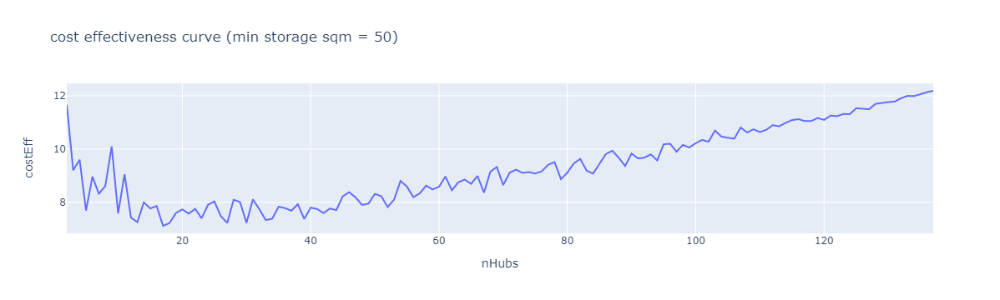

In [17]:
costEff = pd.DataFrame.from_dict(costEffDict, orient='index').reset_index()
costEff.rename(columns={'index': 'nHubs', 0: 'costEff'}, inplace=True)
px.line(costEff, 'nHubs', 'costEff', title='cost effectiveness curve (min storage sqm = 50)')

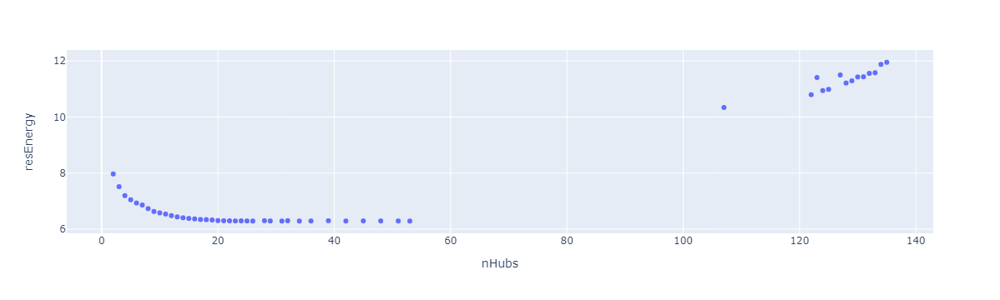

In [17]:
plotResEnergy('results/resEnergy_230328_2-138.csv')

### storage duration = 1 month

In [73]:
%%time
costEffDict = {}
for nHubs in range(2,138):
    firstGuess = findFirstGuess(nHubs, candiHubs, matGrid)
    firstGuess_array = np.array(firstGuess.hubName)
    costEff = calcTotCostEffectiveness_r(firstGuess_array, runInR=False)
    costEffDict[nHubs] = costEff
    print('costEff for {}: {}'.format(nHubs, costEff))

costEff for 2: 8.181445184533885
costEff for 3: 7.704358293626908
costEff for 4: 8.256895084650722
costEff for 5: 8.183313040590619
costEff for 6: 7.772300682104543
costEff for 7: 7.707172066191031
costEff for 8: 7.810054052645172
costEff for 9: 7.884413140513288
costEff for 10: 7.386847575604746
costEff for 11: 7.356676234639887
costEff for 12: 7.428811204633298
costEff for 13: 7.478851998417977
costEff for 14: 7.36013875340811
costEff for 15: 7.337351069394665
costEff for 16: 7.38764181130096
costEff for 17: 7.217172967480983
costEff for 18: 7.200767209802893
costEff for 19: 7.169371879401605
costEff for 20: 7.121973220128737
costEff for 21: 6.9165075061126835
costEff for 22: 6.8951241054020205
costEff for 23: 6.896564793906106
costEff for 24: 7.039262171287422
costEff for 25: 6.941231373245842
costEff for 26: 7.064538724259304
costEff for 27: 6.911917997207874
costEff for 28: 6.799014017038624
costEff for 29: 6.832692663245783
costEff for 30: 6.831275883419249
costEff for 31: 6.8330

In [98]:
costEff = pd.DataFrame.from_dict(costEffDict, orient='index').reset_index()
costEff.rename(columns={'index': 'nHubs', 0: 'costEff'}, inplace=True)
nHubsLowest = costEff.sort_values('costEff').iloc[0,0]
print('nHubs with lowest costEff: {}'.format(nHubsLowest))
costEff.sort_values('costEff').head(5)

nHubs with lowest costEff: 92


,nHubs,costEff
90,92,6.509376
81,83,6.510974
69,71,6.511049
94,96,6.511580
57,59,6.511797


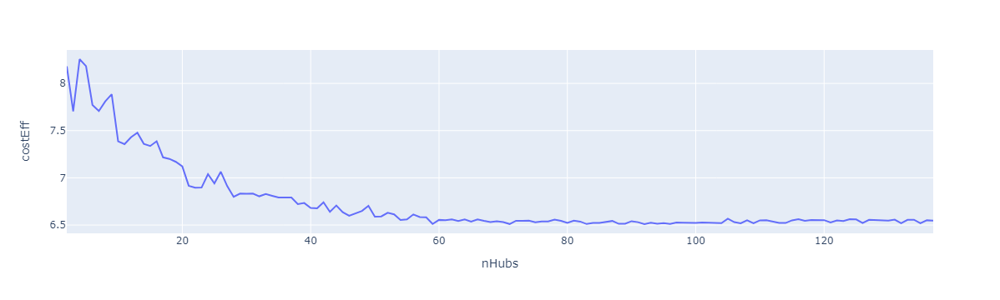

In [95]:
px.line(costEff, 'nHubs', 'costEff')

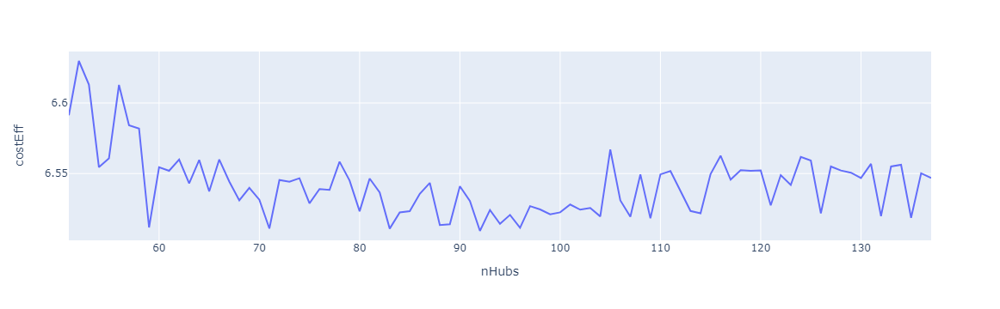

In [101]:
px.line(costEff[costEff.nHubs > 50], 'nHubs', 'costEff')

In [103]:
costEff.to_csv('results/costEff_firstGuesses_storage1Month.csv')

In [19]:
solution_1month = findFirstGuess(92, candiHubs, matGrid)

In [23]:
matGrid.crs

<Derived Projected CRS: EPSG:28992>
Name: Amersfoort / RD New
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: Netherlands - onshore, including Waddenzee, Dutch Wadden Islands and 12-mile offshore coastal zone.
- bounds: (3.2, 50.75, 7.22, 53.7)
Coordinate Operation:
- name: RD New
- method: Oblique Stereographic
Datum: Amersfoort
- Ellipsoid: Bessel 1841
- Prime Meridian: Greenwich

<AxesSubplot: >

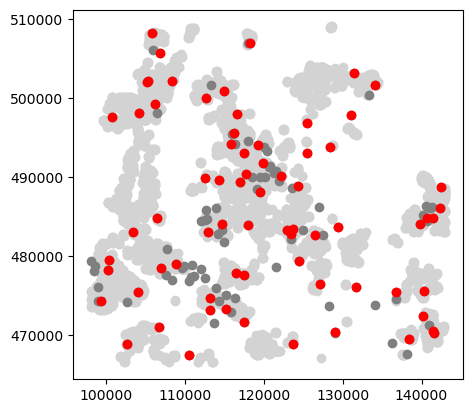

In [20]:
ax = matGrid.plot(color='lightgrey')
candiHubs.plot(color='grey', ax=ax)
solution_1month.plot(ax=ax, color='red')

In [21]:
solution_6months = findFirstGuess(3, candiHubs, matGrid)
solution_12months = solution_6months.copy()

<AxesSubplot: >

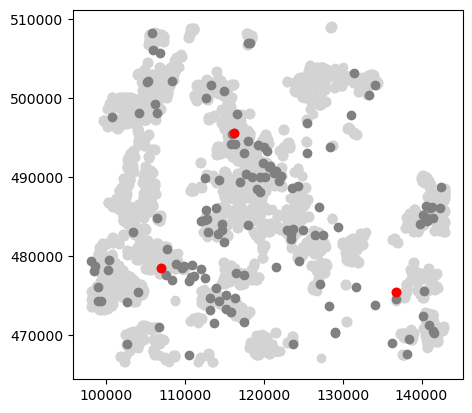

In [22]:
ax = matGrid.plot(color='lightgrey')
candiHubs.plot(color='grey', ax=ax)
solution_6months.plot(ax=ax, color='red')

### storage duration = 6 months

In [108]:
%%time
costEffDict_6Months = {}
for nHubs in range(2,138):
    firstGuess = findFirstGuess(nHubs, candiHubs, matGrid)
    firstGuess_array = np.array(firstGuess.hubName)
    costEff = calcTotCostEffectiveness_r(firstGuess_array, runInR=False)
    costEffDict_6Months[nHubs] = costEff
    print('costEff for {}: {}'.format(nHubs, costEff))

costEff for 2: 35.636213426342856
costEff for 3: 34.81966634987039
costEff for 4: 40.0464881767768
costEff for 5: 40.85364263449574
costEff for 6: 39.159893897502705
costEff for 7: 39.2374114302337
costEff for 8: 40.35262017584825
costEff for 9: 40.44909742198807
costEff for 10: 38.024285924059484
costEff for 11: 38.111427110741815
costEff for 12: 38.494929982017666
costEff for 13: 38.968759401696
costEff for 14: 38.131847071815066
costEff for 15: 38.169538293410525
costEff for 16: 38.64442686362846
costEff for 17: 38.09441969414722
costEff for 18: 38.253251273538865
costEff for 19: 38.0019097493494
costEff for 20: 37.96141290582416
costEff for 21: 37.01130092998067
costEff for 22: 36.950515979424
costEff for 23: 37.031177911073904
costEff for 24: 37.96198723764673
costEff for 25: 37.42486663002308
costEff for 26: 38.03841746033879
costEff for 27: 37.365714195754514
costEff for 28: 36.87607082374366
costEff for 29: 36.97400717646615
costEff for 30: 37.00242395303395
costEff for 31: 37.

In [109]:
costEff_6months = pd.DataFrame.from_dict(costEffDict_6Months, orient='index').reset_index()
costEff_6months.rename(columns={'index': 'nHubs', 0: 'costEff'}, inplace=True)
nHubsLowest = costEff_6months.sort_values('costEff').iloc[0,0]
print('nHubs with lowest costEff: {}'.format(nHubsLowest))
costEff_6months.sort_values('costEff').head(5)

nHubs with lowest costEff: 3


,nHubs,costEff
1,3,34.819666
0,2,35.636213
57,59,36.016004
52,54,36.130366
69,71,36.136962


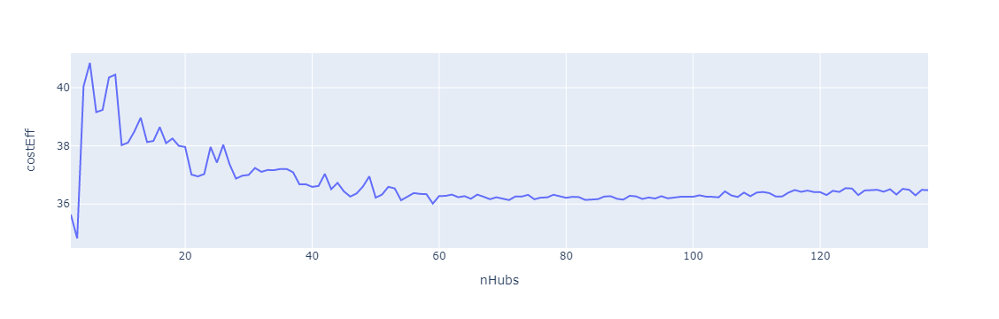

In [110]:
px.line(costEff_6months, 'nHubs', 'costEff')

In [111]:
costEff_6months.to_csv('results/costEff_firstGuesses_storage6Months.csv')

### storage duration = 1 year

In [10]:
%%time
costEffDict_12months = {}
for nHubs in range(2,138):
    firstGuess = findFirstGuess(nHubs, candiHubs, matGrid)
    firstGuess_array = np.array(firstGuess.hubName)
    costEff = calcTotCostEffectiveness_r(firstGuess_array, runInR=False)
    costEffDict_12months[nHubs] = costEff
    print('costEff for {}: {}'.format(nHubs, costEff))

costEff for 2: 68.58193531651362
costEff for 3: 67.35803601736256
costEff for 4: 78.19399988732809
costEff for 5: 80.0580381471819
costEff for 6: 76.8250057559805
costEff for 7: 77.0736986670849
costEff for 8: 79.40369952369196
costEff for 9: 79.52671855975781
costEff for 10: 74.78921194220517
costEff for 11: 75.01712816206414
costEff for 12: 75.77427251487892
costEff for 13: 76.75664828562962
costEff for 14: 75.05789705390342
costEff for 15: 75.16816296222957
costEff for 16: 76.15256892642147
costEff for 17: 75.14711576614671
costEff for 18: 75.51623215002203
costEff for 19: 75.00095519328676
costEff for 20: 74.96874052865867
costEff for 21: 73.12505303862226
costEff for 22: 73.01698622825037
costEff for 23: 73.19271365167526
costEff for 24: 75.06925731727792
costEff for 25: 74.00522893815578
costEff for 26: 75.20707194363418
costEff for 27: 73.91026963401046
costEff for 28: 72.96853899178971
costEff for 29: 73.1435845923306
costEff for 30: 73.20780163657157
costEff for 31: 73.7286202

In [13]:
costEff_12months = pd.DataFrame.from_dict(costEffDict_12months, orient='index').reset_index()
costEff_12months.rename(columns={'index': 'nHubs', 0: 'costEff'}, inplace=True)
nHubsLowest = costEff_12months.sort_values('costEff').iloc[0,0]
print('nHubs with lowest costEff: {}'.format(nHubsLowest))
costEff_12months.sort_values('costEff').head(5)

nHubs with lowest costEff: 3


,nHubs,costEff
1,3,67.358036
0,2,68.581935
57,59,71.421053
52,54,71.621397
69,71,71.688058


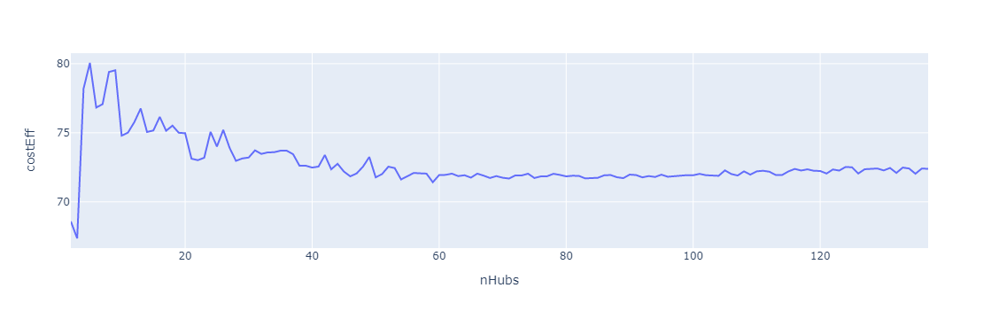

In [15]:
px.line(costEff_12months, 'nHubs', 'costEff')

In [16]:
costEff_12months.to_csv('results/costEff_firstGuesses_storage12Months.csv')

## comparing with first guess

In [104]:
def addToStatsDict(solType, hubs, matGridAss): 
    co2Reduction = calcTotCo2Reduction(hubs, matGridAss, tco2ReductionPerTon)
    storageCost = calcTotStorageCost(hubs, matGridAss, candiHubs, storageMonths=1)
    transCost = calcTotTransportationCost(hubs, matGridAss, distMatrix, costPerKmPerTon)
    transEmissions = calcTotTransportationEmissions(hubs, matGridAss, distMatrix, emissionsPerTonPerKm)
    costEff = (storageCost + transCost) / (co2Reduction - transEmissions)
    
    # add to dict
    statsDict['solType'].append(solType)
    statsDict['co2'].append(co2Reduction)
    statsDict['transEmissions'].append(transEmissions)
    statsDict['storageCost'].append(storageCost)
    statsDict['transCost'].append(transCost)
    statsDict['costEff'].append(costEff)

In [69]:
tco2ReductionPerTon = coefs['tco2ReductionPerTon']
storageMonths = coefs['storageMonths']
buildingPrice = coefs['buildingPrice']
costPerKmPerTon = coefs['costPerKmPerTon']
emissionsPerTonPerKm = coefs['emissionsPerTonPerKm']
distMatrix = distMatrixAms.copy()

In [106]:
statsDict = {
    'solType': [], 
    'co2': [], 
    'transEmissions': [], 
    'storageCost': [],
    'transCost': [], 
    'costEff': []
}

# solution from sa 
nHubs = 3
solSa = resPoints[resPoints.nHubs == nHubs]
solSa = solSa[solSa.timeStamp == '2023-03-18 09:08:20']
solSa = solSa[['hubName', 'geometry']]
solSa.hubName = solSa.hubName - 1

# make stats 
matGridAss = assignHubsToGridCells(solSa, matGrid, distMatrix)
hubs = candiHubs[candiHubs.hubName.isin(list(solSa.hubName))]
addToStatsDict('sa', hubs, matGridAss)

# solution from first guess
hubs = findFirstGuess(3, candiHubs, matGrid)
matGridAss = assignHubsToGridCells(hubs, matGrid, distMatrix)
addToStatsDict('fg', hubs, matGridAss)

In [115]:
statsDf = pd.DataFrame(statsDict)
statsDf['totCost'] = statsDf.transCost + statsDf.storageCost
statsDf['co2savings'] = statsDf.co2 - statsDf.transEmissions
statsDf

,solType,co2,transEmissions,storageCost,transCost,costEff,totCost,co2savings
0,sa,527812.578692,433.052907,2.858890e+06,1.054480e+06,7.420404,3.913369e+06,527379.525785
1,fg,527812.578692,494.034860,2.859681e+06,1.202970e+06,7.704358,4.062651e+06,527318.543832


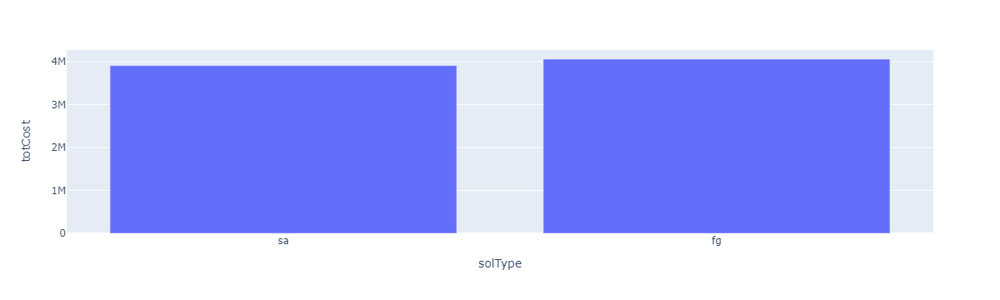

In [117]:
px.bar(statsDf, x='solType', y='totCost')

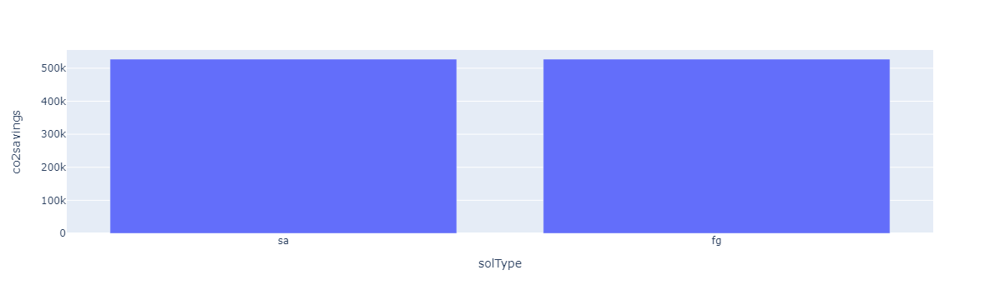

In [116]:
px.bar(statsDf, x='solType', y='co2savings')

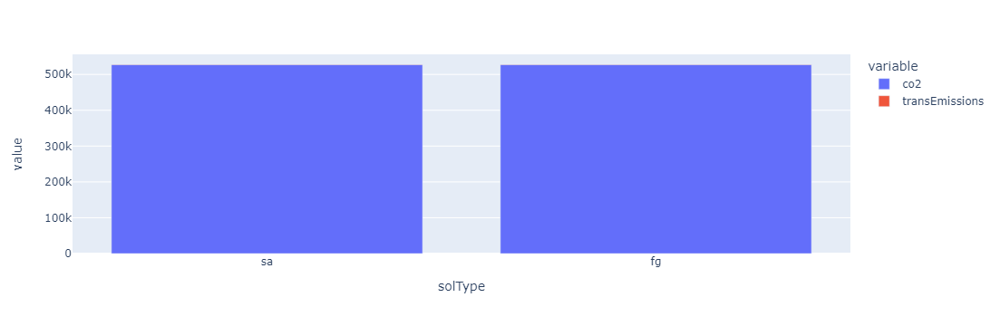

In [112]:
px.bar(statsDf, x='solType', y=['co2', 'transEmissions'])

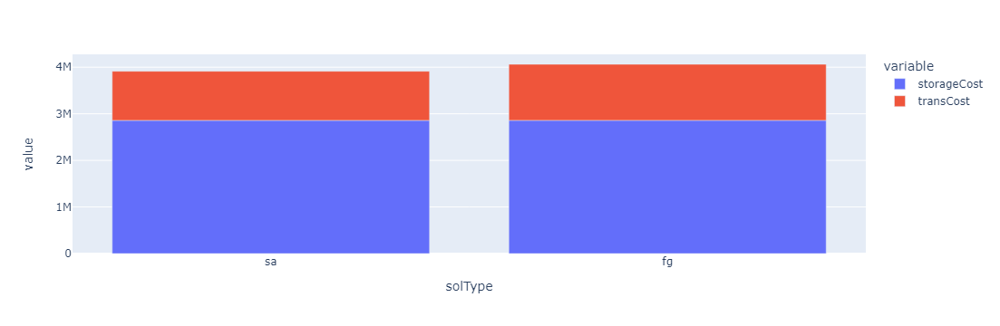

In [111]:
px.bar(statsDf, x='solType', y=['storageCost', 'transCost'])

<AxesSubplot: >

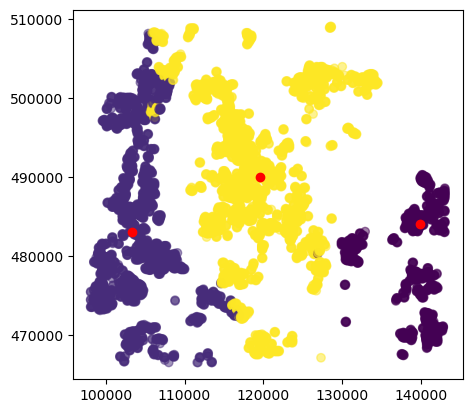

In [56]:
ax = matGridAss.plot(column='hubName', alpha=0.5)
solSa.plot(ax=ax, color='red')

## Comparing optimized hubs for SA and first guess

In [173]:
def makeStats(hubs): 
    matGridAss = assignHubsToGridCells(hubs, matGrid, distMatrix)
    co2Reduction = calcTotCo2Reduction(hubs, matGridAss, tco2ReductionPerTon)
    storageCost = calcTotStorageCost(hubs, matGridAss, candiHubs, storageMonths=1)
    transCost = calcTotTransportationCost(hubs, matGridAss, distMatrix, costPerKmPerTon)
    transEmissions = calcTotTransportationEmissions(hubs, matGridAss, distMatrix, emissionsPerTonPerKm)
    costEff = (storageCost + transCost) / (co2Reduction - transEmissions)

    return [co2Reduction, storageCost, transCost, transEmissions, costEff]

In [155]:
# optimized hubs for sa 
nHubsOptim = resEnergy.sort_values('resEnergy').iloc[0, 2]
hubsOptim = resPoints[resPoints.nHubs == nHubsOptim][['hubName', 'geometry']]
hubsOptim.hubName = hubsOptim.hubName - 1
hubNames = list(hubsOptim.hubName)
hubsOptim_sa = candiHubs[candiHubs.hubName.isin(hubNames)]

# optimized hubs for first guess (fg) 
nHubsOptim = 92
hubsOptim_fg = findFirstGuess(nHubsOptim, candiHubs, matGrid)

In [175]:
hubsDict = {
    'sa': hubsOptim_sa, 'fg': hubsOptim_fg 
}
statsDict = dict.fromkeys(['sa', 'fg'])
for solType, hubs in hubsDict.items(): 
    stats = makeStats(hubs)
    statsDict[solType] = stats

In [182]:
cols = ['co2Reduction', 'storageCost', 'transCost', 
        'transEmissions', 'costEff']
statsDf = pd.DataFrame.from_dict(statsDict, orient='index', columns=cols)
statsDf = statsDf.reset_index()
statsDf.rename(columns={'index': 'solType'}, inplace=True)
statsDf

,solType,co2Reduction,storageCost,transCost,transEmissions,costEff
0,sa,457714.694635,2.489775e+06,320354.544672,131.562944,6.141244
1,fg,451627.938410,2.678955e+06,260165.469813,106.844555,6.509376


In [191]:
compare = statsDf.T
compare.rename(columns={0:'sa', 1:'fg'}, inplace=True)
compare = compare.iloc[1:]
compare['diff'] = compare.sa - compare.fg
compare

,sa,fg,diff
co2Reduction,457714.694635,451627.93841,6086.756226
storageCost,2489775.241804,2678954.886458,-189179.644654
transCost,320354.544672,260165.469813,60189.074859
transEmissions,131.562944,106.844555,24.718389
costEff,6.141244,6.509376,-0.368131


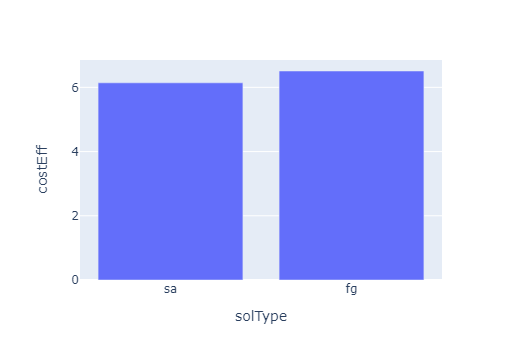

In [177]:
px.bar(statsDf, x='solType', y='costEff')

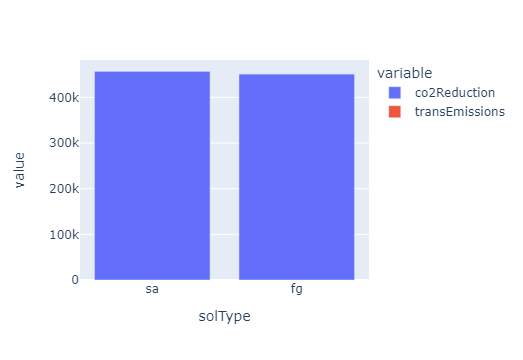

In [172]:
px.bar(statsDf, x='solType', y=['co2Reduction', 'transEmissions'])

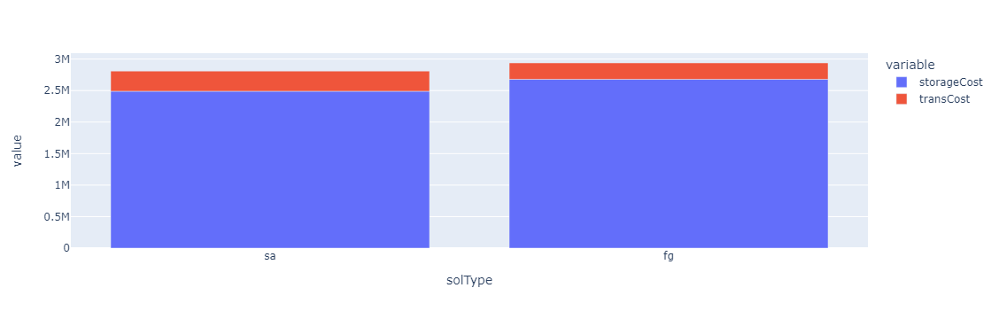

In [171]:
px.bar(statsDf, x='solType', y=['storageCost', 'transCost'])

In [211]:
coefs

{'tco2ReductionPerTon': 1.52,
 'storageMonths': 6,
 'buildingPrice': 250,
 'costPerKmPerTon': 0.06,
 'emissionsPerTonPerKm': 2.464074074074074e-05}

<AxesSubplot: >

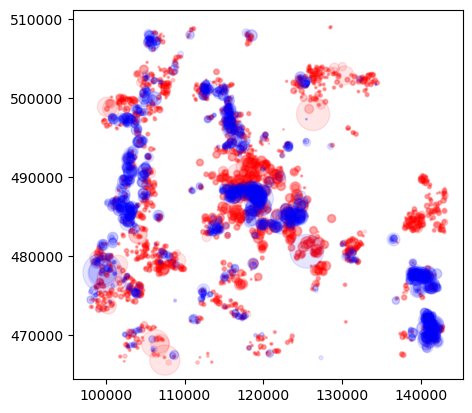

In [223]:
ax = matGrid.plot(markersize=matGrid.kgDemand/10000*0.5, alpha=0.1, color='red')
matGrid.plot(markersize=matGrid.kgSupply/10000*2, alpha=0.1, color='blue', ax=ax)

<AxesSubplot: >

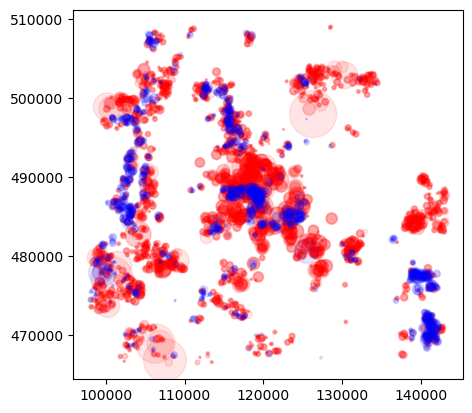

In [220]:
ax = matGrid.plot(markersize=matGrid.kgDemand/10000, alpha=0.1, color='red')
matGrid.plot(markersize=matGrid.kgSupply/10000, alpha=0.1, color='blue', ax=ax)

<AxesSubplot: >

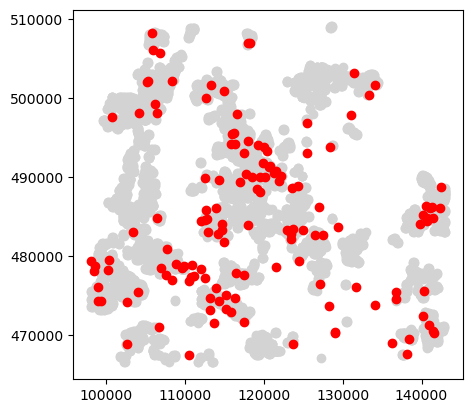

In [210]:
ax = matGrid.plot(color='lightgrey')
candiHubs.plot(color='red', ax=ax)

## Performance - running in db

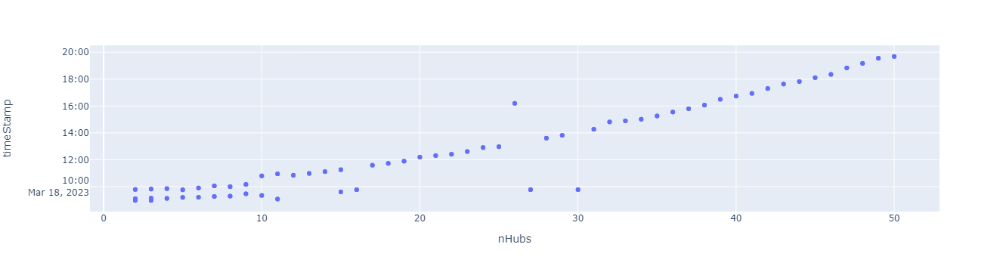

In [42]:
cols = ['index', 'resEnergy', 'nHubs', 'timeStamp']
resEnergy = pd.read_csv('results/resEnergy_parallel.csv', header=None, names=cols)
px.scatter(resEnergy, 'nHubs', 'timeStamp')

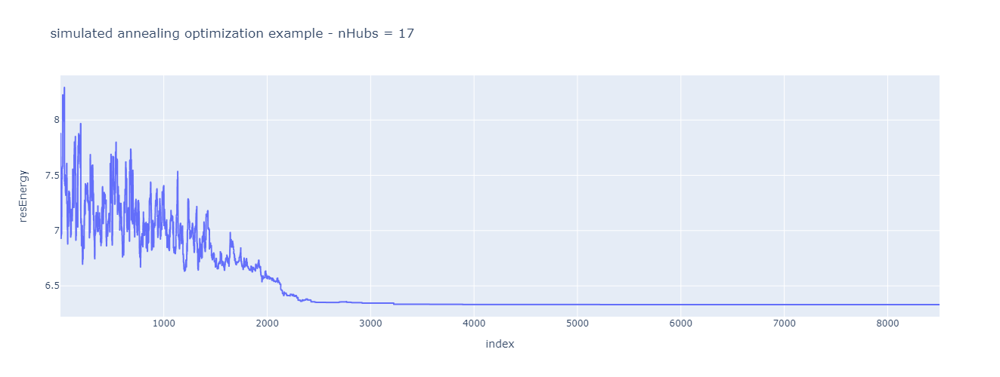

In [220]:
cols = ['index', 'resEnergy', 'nHubs', 'timeStamp']
resValues = pd.read_csv('results/_backup/resEnergy_parallel_2-50_failed.csv', header=None, names=cols)
resValues = resValues[resValues.nHubs == 17]
resValues
px.line(resValues, 'index', 'resEnergy', title='simulated annealing optimization example - nHubs = 17', width=800, height=500)